<a href="https://colab.research.google.com/github/shairipBGU/plant_metabolites/blob/main/Plant_metabolites.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#IMPORTS

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install requests beautifulsoup4
!pip install wikipedia
!pip install SPARQLWrapper
!pip install xmltodict
!pip3 install wikipedia-api

  Preparing metadata (setup.py) ... done
  Created wheel for wikipedia: filename=wikipedia-1.4.0-py3-none-any.whl size=11680 sha256=eb3b8f0b47f87ffdeee8952cbffe2ad1abd979eed8110a5876c52afaf73a3b4e
  Stored in directory: /root/.cache/pip/wheels/5e/b6/c5/93f3dec388ae76edc830cb42901bb0232504dfc0df02fc50de
Successfully built wikipedia
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 531.9/531.9 kB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.7/41.7 kB 5.4 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import requests
from bs4 import BeautifulSoup
import os
import json

#Rivka data

In [ ]:
rivki_data = pd.read_excel('/content/drive/Shareddrives/big_data/Rivki_Arava_Library of Desert Plants.xls')
rivki_data

,hebrew_name,hebrew_last_name,latin_name,latin_family_name
0,יפרוק המדבר,סלקיים,ANABASIS ARTICULATA,CHENOPODIACEAL
1,קפודן בלנש,מרכיבים,ECHINOPS POLYCERAS,COMPOSITAL
2,ימלוח פגום,זוגניים,NITRARIA,ZYGOPHYLLACELA
3,פגוניה ערבית,זוגניים,FAGONIA ARABICA,ZYGOPHYLLACELA
4,בוצין שיחני,לועניתיים,VERBASCUM TRUTICULOSUM,SCROPHULARIACL
...,...,...,...,...
223,גמאיים,עלי עב-חלוד (גמאיים),FIMBRISTYLIS FERRUGINEA,CYPERACEAL
224,סלקיים,בן-מלח מכחיל (סלקיים),ARTHROCNEMUM MACROSTACHYUM,CHENOPODIA CEAL
225,סלקיים,אוכם חד ביתי (סלקיים),SUAEDA MONOICA,CHENOPODIA CEAL
226,סלקיים,שנהבית הרוזמרין (סלקיים),SEIDLITGIA ROSMARINUS,CHENOPODIA CEAL


In order to find similar plants on PMN, we check the number of families in Rivki data and then count the number of plants within each family.

In [ ]:
rivki_data.latin_family_name.value_counts()

COMPOSITAL          22
CHENOPODIA CEAL     20
ZYGOPHYLLACLAL      18
CRUCIFERAL          18
GRAMINEAE           15
PAPILIONACEAL       10
CARYOPHYLLACEAL      9
ASCLEPIADACLAL       8
RESEDACEAL           6
CHENOPODIACEAL       5
BORAGINACEAL         5
SOLANACLAL           5
MALVACEAL            5
LILIACEAL            5
CHENOPODIACLAL       5
CAPPARACEAL          4
ZYGOPHYLLACEAL       4
POLYGONCEAL          3
EUPHORBIACEAL        3
SCROPHULARIACLAL     3
LABIATAL             3
MIMOSACEAL           3
AIGOACEAL            3
TAMARICACLAL         3
CYPERACEAL           2
ZYGOPHYLLACELA       2
PAPILIONACLAL        2
AMARANTHACEAL        2
CHENOPODIACEAE       2
URTICACEAL           2
SOLANACEAL           2
PLANTAGINACEAL       1
NEURADACEAL          1
THYMELACELA          1
JUNCACEAL            1
THYMELAEACEAL        1
CUPRESSACEAL         1
CUCURBITACEAL        1
UMBELLIFERAL         1
GERANIACEAL          1
MENISPERMACEAL       1
RUTACLAL             1
MORINGACEAL          1
EPHEDRACEAL

#PLANT METABOLIC PATHWAY DATABASES
the pmn database (plant metabolic network) has 126 species of plants with metabolome data including genes, Pathways, Enzymes and compounds. we will focus on compounds which includes thousands for each plant.

In [ ]:
url = "https://plantcyc.org/releases/?qt-releases=2#qt-releases"

response = requests.get(url)
response.raise_for_status()
soup = BeautifulSoup(response.content, "html.parser")
dataset_section = soup.find("fieldset", {"class": "group-release-databases"})
print(dataset_section)
if dataset_section:
    dataset_links = dataset_section.find_all("a")

    dataset_info = []
    for link in dataset_links:
        dataset_name = link.text.strip()
        dataset_link = link["href"]
        dataset_info.append((dataset_name, "https://plantcyc.org"+dataset_link))

    # Create a dataFrame for the data
    dataset_info.append(('BarleyCyc 7.0.1', "https://plantcyc.org"+'/content/barleycyc-7.0.1'))
    Database_names = pd.DataFrame(dataset_info, columns=["Database Name", "Link to Table"])

<fieldset class="collapsible collapsed group-release-databases field-group-htab form-wrapper" id="databases"><legend><span class="fieldset-legend">Databases</span></legend><div class="fieldset-wrapper"><div class="field field-name-field-field-included-dbs field-type-entityreference field-label-hidden"><div class="field-items"><div class="field-item even"><a href="/content/plantcyc-15.2.0">PlantCyc 15.2.0</a></div><div class="field-item odd"><a href="/content/acoeruleacyc-2.0.2">AcoeruleaCyc 2.0.2</a></div><div class="field-item even"><a href="/content/ahallericyc-4.0.0">AhalleriCyc 4.0.0</a></div><div class="field-item odd"><a href="/content/ahypochondriacuscyc-3.0.2">AhypochondriacusCyc 3.0.2</a></div><div class="field-item even"><a href="/content/alyratacyc-3.0.2">AlyrataCyc 3.0.2</a></div><div class="field-item odd"><a href="/content/amborellacyc-3.0.2">AmborellaCyc 3.0.2</a></div><div class="field-item even"><a href="/content/aracyc-17.2.0">AraCyc 17.2.0</a></div><div class="field-

In [ ]:
Database_names

,Database Name,Link to Table
0,PlantCyc 15.2.0,https://plantcyc.org/content/plantcyc-15.2.0
1,AcoeruleaCyc 2.0.2,https://plantcyc.org/content/acoeruleacyc-2.0.2
2,AhalleriCyc 4.0.0,https://plantcyc.org/content/ahallericyc-4.0.0
3,AhypochondriacusCyc 3.0.2,https://plantcyc.org/content/ahypochondriacusc...
4,AlyrataCyc 3.0.2,https://plantcyc.org/content/alyratacyc-3.0.2
...,...,...
122,WheataCyc 6.0.0,https://plantcyc.org/content/wheatacyc-6.0.0
123,WheatdCyc 5.0.2,https://plantcyc.org/content/wheatdcyc-5.0.2
124,WildsugarcaneCyc 1.1.1,https://plantcyc.org/content/wildsugarcanecyc-...
125,ZmarinaCyc 4.0.0,https://plantcyc.org/content/zmarinacyc-4.0.0


In [ ]:
def find_pgdb_link(url):
  response = requests.get(url)
  response.raise_for_status()
  soup = BeautifulSoup(response.content, "html.parser")
  dataset_section = soup.find("div", {"class": "field-name-field-link-to-pgdb"})
  link_to_pgdb = dataset_section.find('a')['href']
  return link_to_pgdb

Database_names['link_to_pgdb'] = Database_names['Link to Table'].apply(find_pgdb_link)
Database_names

,Database Name,Link to Table,link_to_pgdb
0,PlantCyc 15.2.0,https://plantcyc.org/content/plantcyc-15.2.0,http://pmn.plantcyc.org/organism-summary?objec...
1,AcoeruleaCyc 2.0.2,https://plantcyc.org/content/acoeruleacyc-2.0.2,http://pmn.plantcyc.org/organism-summary?objec...
2,AhalleriCyc 4.0.0,https://plantcyc.org/content/ahallericyc-4.0.0,http://pmn.plantcyc.org/organism-summary?objec...
3,AhypochondriacusCyc 3.0.2,https://plantcyc.org/content/ahypochondriacusc...,http://pmn.plantcyc.org/organism-summary?objec...
4,AlyrataCyc 3.0.2,https://plantcyc.org/content/alyratacyc-3.0.2,http://pmn.plantcyc.org/organism-summary?objec...
...,...,...,...
122,WheataCyc 6.0.0,https://plantcyc.org/content/wheatacyc-6.0.0,http://pmn.plantcyc.org/organism-summary?objec...
123,WheatdCyc 5.0.2,https://plantcyc.org/content/wheatdcyc-5.0.2,http://pmn.plantcyc.org/organism-summary?objec...
124,WildsugarcaneCyc 1.1.1,https://plantcyc.org/content/wildsugarcanecyc-...,http://pmn.plantcyc.org/organism-summary?objec...
125,ZmarinaCyc 4.0.0,https://plantcyc.org/content/zmarinacyc-4.0.0,http://pmn.plantcyc.org/organism-summary?objec...


In [ ]:
def find_official_name(url):
  response = requests.get(url)
  response.raise_for_status()
  soup = BeautifulSoup(response.content, "html.parser")
  try:
    official_name = soup.find("div", {"class": "field-name-field-taxon-range"}).find('div',  {"class": "field-item even"}).text
  except:
    print(f'cant get name for {url}')
    return ''

  return official_name

Database_names['official_name'] = Database_names['Link to Table'].apply(find_official_name)
Database_names

,Database Name,Link to Table,link_to_pgdb,official_name
0,PlantCyc 15.2.0,https://plantcyc.org/content/plantcyc-15.2.0,http://pmn.plantcyc.org/organism-summary?objec...,primarily Viridiplantae
1,AcoeruleaCyc 2.0.2,https://plantcyc.org/content/acoeruleacyc-2.0.2,http://pmn.plantcyc.org/organism-summary?objec...,Aquilegia coerulea
2,AhalleriCyc 4.0.0,https://plantcyc.org/content/ahallericyc-4.0.0,http://pmn.plantcyc.org/organism-summary?objec...,Arabidopsis halleri
3,AhypochondriacusCyc 3.0.2,https://plantcyc.org/content/ahypochondriacusc...,http://pmn.plantcyc.org/organism-summary?objec...,Amaranthus hypochondriacus
4,AlyrataCyc 3.0.2,https://plantcyc.org/content/alyratacyc-3.0.2,http://pmn.plantcyc.org/organism-summary?objec...,Arabidopsis lyrata
...,...,...,...,...
122,WheataCyc 6.0.0,https://plantcyc.org/content/wheatacyc-6.0.0,http://pmn.plantcyc.org/organism-summary?objec...,Triticum urartu
123,WheatdCyc 5.0.2,https://plantcyc.org/content/wheatdcyc-5.0.2,http://pmn.plantcyc.org/organism-summary?objec...,Aegilops tauschii
124,WildsugarcaneCyc 1.1.1,https://plantcyc.org/content/wildsugarcanecyc-...,http://pmn.plantcyc.org/organism-summary?objec...,Saccharum spontanaeum
125,ZmarinaCyc 4.0.0,https://plantcyc.org/content/zmarinacyc-4.0.0,http://pmn.plantcyc.org/organism-summary?objec...,Zostera marina


For each plant we have compounds for we would like to get more features to check for corolation with the compounds. possible interesting features are taxonomy groups of the plant, areas it grows in, different pictures of the plant, etc'.

Extract the metabolic data from PMN

In [ ]:
import requests
import xmltodict
import pandas as pd


url = 'https://plantcyc-ftp.storage.googleapis.com/?delimiter=/&prefix=pmn/Pathways/Data_dumps/PMN15.5_January2023/compounds/'
response = requests.get(url)
data_dict = xmltodict.parse(response.content)

contents = data_dict['ListBucketResult']['Contents']
data = []
if isinstance(contents, list):
    for content in contents:
        key = content['Key']
        path = "https://plantcyc-ftp.storage.googleapis.com/"+key
        compound_name = key.split('/')[5]
        compound_name = compound_name.split('_compounds')[0]
        data.append({'compound_name': compound_name, 'path': path})
else:  # If there is only one content
    key = contents['Key']
    compound_name = key.split('/')[5]
    compound_name = compound_name.split('_compounds')[0]
    path = "https://plantcyc-ftp.storage.googleapis.com/"+key
    data.append({'compound_name': compound_name, 'path': path})

# Create a DataFrame from the extracted data
df = pd.DataFrame(data)


In [ ]:
df = df.drop_duplicates(subset='compound_name', keep='first')
df

,compound_name,path
0,acoeruleacyc,https://plantcyc-ftp.storage.googleapis.com/pm...
2,ahallericyc,https://plantcyc-ftp.storage.googleapis.com/pm...
4,ahypochondriacuscyc,https://plantcyc-ftp.storage.googleapis.com/pm...
5,alyratacyc,https://plantcyc-ftp.storage.googleapis.com/pm...
6,amborellacyc,https://plantcyc-ftp.storage.googleapis.com/pm...
...,...,...
125,watermeloncyc,https://plantcyc-ftp.storage.googleapis.com/pm...
126,wheatacyc,https://plantcyc-ftp.storage.googleapis.com/pm...
127,wheatdcyc,https://plantcyc-ftp.storage.googleapis.com/pm...
128,wildsugarcanecyc,https://plantcyc-ftp.storage.googleapis.com/pm...


In [ ]:
# Merging between compounds df and labels df
# Database_names['compound_name'] = Database_names['Database Name'].apply(lambda x: x.lower().split(' ')[0])
# df = df.merge(Database_names, on='compound_name', how='left')


Obtaining and saving the data from the PMN website on the shared drive to avoid future downloads.

In [ ]:
data = []
for index, row in df.iterrows():
    species = row['compound_name']
    link = row['path']
    path = f'/content/drive/Shareddrives/big_data/species_data/{species}'
    # !wget -O {path}.txt $link
    if os.path.exists(f'{path}.txt'):
      # File exists, proceed with reading
      file = pd.read_csv(f'{path}.txt', sep='\t', lineterminator='\n')
    else:
      print(f"The file '{path}.txt' does not exist.")
      !wget -O {path}.txt $link
    compunds_list = set(file['Compound_common_name'].tolist())
    print(compunds_list)
    print(len(compunds_list))
    data.append({'species': species, 'compunds_list': compunds_list, 'compunds_list_len': len(compunds_list)})

df_compounds = pd.DataFrame(data)

{'1-pyrroline', 'gibberellin A15 (open lactone form)', '1-(2-carboxyphenylamino)-1-deoxy-D-ribulose 5-phosphate', 'betulin', 'glyoxylate', 'butyl propanoate', 'apiforol', 'a [glycerolipid]-arachidonate', 'inosine', '(11Z,14Z,17Z)-icosatrienoyl-CoA', '1-O-sinapoyl-beta-D-glucose', 'NAD+', 'L-ascorbate', '5-amino-6-(5-phospho-D-ribitylamino)uracil', '(R)-pantoate', 'an adenosine37 in tRNA', '(22S,24R)-22-hydroxy-5alpha-ergostan-3-one', 'a phosphatidylethanolamine', 'alpha,omega-9Z-octadecenedioate', '1-palmitoyl-2-vernoloyl-phosphatidylcholine', '1-18:2-2-18:2-monogalactosyldiacylglycerol', 'a [glycine-cleavage complex H protein] N6-dihydrolipoyl-L-lysine', '22-hydroxy-docosanoyl-CoA', 'chlorophyllide a', 'alpha-Kdo-(2->4)-alpha-Kdo-(2->6)-lipid IVA', 'a 3-oxooctadecanoyl-[acp]', 'D-mannitol', 'isochorismate', 'chitin', 'a fatty aldehyde', 'a glucan', 'D-mannopyranose 6-phosphate', '4-amino-2-methyl-5-(phosphooxymethyl)pyrimidine', 'beta-L-galactose 1-phosphate', 'a 1,2-diacyl-3-O-(beta-

In [ ]:
array = df_compounds['compunds_list'].values
flattened_list = [item for sublist in array for item in sublist]
unique_list = set(flattened_list)

In [ ]:
len(unique_list)

4328

In [ ]:
columns_names = ['species']
columns_names.extend(list(unique_list))
print(columns_names)

['species', '(8Z,11Z,14Z,17Z)-3-oxoicosatetraenoyl-CoA', '4-hydroxy-3-decaprenylbenzoate', 'tomatid-4-en-3-one', '1-pyrroline', 'cathenamine', 'hydroxylamine', 'L-homomethionine', '2-methylfumaryl-CoA', '(-)-endo-alpha-bergamotene', 'gibberellin A15 (open lactone form)', 'sutherlandin', '1-(2-carboxyphenylamino)-1-deoxy-D-ribulose 5-phosphate', '1-phenyl-3-(3-C-glucosyl-2,4,6-trihydroxyphenyl)propane-1,3-dione', 'betulin', '10-(methylsulfanyl)-2-oxodecanoate', 'glyoxylate', "isovitexin 2''-O-beta-D-glucoside", '4-methylumbelliferyl glucoside', 'butyl propanoate', 'methylchavicol', 'apiforol', 'all-trans phytofluene', 'a [glycerolipid]-arachidonate', '(9Z,12Z,15Z)-hexadeca-9,12,15-trienoyl-CoA', 'inosine', 'a [cullin]-N6-[NEDD8-protein]-yl-L-lysine', '1,3,6,7-tetrahydroxyxanthone', '1,6,7-trihydroxy-2-methylanthraquinone', '3beta-hydroxy-9beta-pimara-7,15-diene-19,6beta-olide', '(11Z,14Z,17Z)-icosatrienoyl-CoA', '1-O-sinapoyl-beta-D-glucose', 'methyl gibberellin A20', '(E)-1-(glutathion

In [ ]:
final_table = pd.DataFrame(columns = columns_names)

In [ ]:
df_compounds.head()

,species,compunds_list,compunds_list_len
0,acoeruleacyc,"{1-pyrroline, gibberellin A15 (open lactone fo...",1636
1,ahallericyc,"{1-pyrroline, L-homomethionine, gibberellin A1...",1634
2,ahypochondriacuscyc,"{1-pyrroline, gibberellin A15 (open lactone fo...",1557
3,alyratacyc,"{1-pyrroline, L-homomethionine, gibberellin A1...",1681
4,amborellacyc,"{1-pyrroline, gibberellin A15 (open lactone fo...",1593


In [ ]:
data = []
for index, row in df_compounds.iterrows():
  name = row['species']
  compunds_list = row['compunds_list']
  # data.append({'species': name, 'compunds_list': compunds_list, 'compunds_list_len': len(compunds_list)})
  row_dict = {'species': name}
  data.append(row_dict)
  for column in columns_names:
    if column != 'species':
      row_dict[column] = 0
  for compund in compunds_list:
    row_dict[compund] = 1

df_final = pd.DataFrame(data)



In [ ]:
df_final

,species,"(8Z,11Z,14Z,17Z)-3-oxoicosatetraenoyl-CoA",4-hydroxy-3-decaprenylbenzoate,tomatid-4-en-3-one,1-pyrroline,cathenamine,hydroxylamine,L-homomethionine,2-methylfumaryl-CoA,(-)-endo-alpha-bergamotene,...,"Man8(GlcNAc)2-[protein] (isomer 8A1,2,3B1,3)","1,6-kestotetraose",2-(cystein-S-yl)-2-(1H-indol-3-yl)-acetonitrile,an N-terminal-L-methionyl-L-cysteinyl-[protein],3-(methylsulfanyl)propyl-desulfoglucosinolate,thiamine,3-oxo-2-(cis-2'-pentenyl)-cyclopentane-1-(E-octa-2-enoyl)-CoA,strictosamide,caffeoylserotonin,soyasapogenol B-3-O-beta-D-glucoside
0,acoeruleacyc,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
1,ahallericyc,0,0,0,1,0,0,1,0,0,...,0,0,0,0,1,1,1,0,0,0
2,ahypochondriacuscyc,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
3,alyratacyc,0,0,0,1,0,0,1,0,0,...,0,0,1,0,1,1,1,0,0,0
4,amborellacyc,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122,watermeloncyc,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
123,wheatacyc,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,1,1,0,0,0
124,wheatdcyc,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,1,1,0,0,0
125,wildsugarcanecyc,0,0,0,1,0,1,0,0,0,...,0,0,0,0,0,1,1,0,0,0


Clean the data-frame, remove columns with the same value for all rows

In [ ]:
columns_to_drop = [col for col in df_final.columns if df_final[col].nunique() == 1]
df_final_ = df_final.drop(columns=columns_to_drop)
df_final_

,species,"(8Z,11Z,14Z,17Z)-3-oxoicosatetraenoyl-CoA",4-hydroxy-3-decaprenylbenzoate,tomatid-4-en-3-one,1-pyrroline,cathenamine,hydroxylamine,L-homomethionine,2-methylfumaryl-CoA,(-)-endo-alpha-bergamotene,...,acibenzolar-S-methyl,2'-hydroxypseudobaptigenin,"Man8(GlcNAc)2-[protein] (isomer 8A1,2,3B1,3)","1,6-kestotetraose",2-(cystein-S-yl)-2-(1H-indol-3-yl)-acetonitrile,an N-terminal-L-methionyl-L-cysteinyl-[protein],3-(methylsulfanyl)propyl-desulfoglucosinolate,strictosamide,caffeoylserotonin,soyasapogenol B-3-O-beta-D-glucoside
0,acoeruleacyc,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
1,ahallericyc,0,0,0,1,0,0,1,0,0,...,1,0,0,0,0,0,1,0,0,0
2,ahypochondriacuscyc,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
3,alyratacyc,0,0,0,1,0,0,1,0,0,...,1,0,0,0,1,0,1,0,0,0
4,amborellacyc,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122,watermeloncyc,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
123,wheatacyc,0,0,0,1,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,0
124,wheatdcyc,0,0,0,1,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,0
125,wildsugarcanecyc,0,0,0,1,0,1,0,0,0,...,1,0,0,0,0,0,0,0,0,0


##DBpedia data

We extracted all the data from DBpedia including the images

In [ ]:
from SPARQLWrapper import SPARQLWrapper, JSON
from tqdm.notebook import tqdm
import time


endpoint_url = "http://dbpedia.org/sparql"
sparql = SPARQLWrapper(endpoint_url)

base_query = """
SELECT ?label ?depictions ?comment ?genus ?species ?wikiPageLength
WHERE
{
    VALUES (?plantName) {
        ("%s"@en)
}

?plant rdfs:label ?plantName.
OPTIONAL {?plant rdfs:label ?label.}
OPTIONAL {?plant foaf:depiction ?depictions.}
OPTIONAL {?plant rdfs:comment ?comment.}
OPTIONAL {?plant dbp:genus ?genus.}
OPTIONAL {?plant dbp:species ?species.}
OPTIONAL {?plant dbo:wikiPageLength ?wikiPageLength.}

FILTER ( LANG ( ?label) = 'en' )
FILTER ( LANG (?comment) = 'en' )
}
"""

results_dict = {}
no_results = 0

def get_plant_sparql(plant_name):
    query = base_query % plant_name
    sparql.setQuery(query)
    sparql.setReturnFormat(JSON)
    results = sparql.query().convert()
    return results

get_link_query = """
SELECT  *
WHERE
{
    VALUES (?plantName) {
     ("%s"@en)
     }

?plant rdfs:label ?plantName.

}

"""


def get_plant_link_sparql(plant_name):
  query = get_link_query % plant_name
  sparql.setQuery(query)
  sparql.setReturnFormat(JSON)
  results = sparql.query().convert()
  if len(results['results']['bindings']) == 0:
    return ''
  link = results['results']['bindings'][0]['plant']['value']
  response = requests.get(link)
  response.raise_for_status()
  soup = BeautifulSoup(response.content, "html.parser")
  return soup.find_all("section")[0].find('a').text


not_found_list = []
for plant_name in tqdm(Database_names['official_name'].tolist()):
    time.sleep(2)

    transform_dict = {
      'primarily Viridiplantae': 'Viridiplantae',
      'Arabidopsis thaliana col':'Arabidopsis thaliana',
      'Brassica rapa FPsc':'Brassica rapa',
      'Brassica rapa ssp. pekinensis': 'Napa cabbage',
      'Cannabis sativa Purple Kush': 'Cannabis sativa',
      'Coccomyxa subellipsoidea C-169': 'Coccomyxa',
      'Fragaria vesca subsp. Vesca': 'Fragaria vesca',
      'Kalanchoe laxiflora':'Kalanchoe',
      'Arabidopsis thaliana Ler': 'Arabidopsis thaliana',
      'Micromonas commoda RCC299': 'Micromonas',
      'Micromonas pusilla CCMP1545': 'Micromonas',
      'Nicotiana tabacum TN90': 'Nicotiana tabacum',
      'Olea europaea var. sylvestris': 'Olive',
      'Oryza sativa japonica group': 'Japonica rice',
      'Oropetium thomaeum': 'Oropetium',
      'Cajanus Cajan': 'Pigeon pea',
      'Populus trichocarpa, other Populus species and hybrids': 'Populus trichocarpa',
      'Salvia miltiorrhiza Bunge': 'Salvia miltiorrhiza',
      'Beta vulgaris subsp. vulgaris': 'Beta vulgaris',
      'Prunis avium': 'Prunus avium',
      'Saccharum spontanaeum': 'Saccharum spontaneum',
      'Chromochloris zofingiensis':'Chlorella',
      'Eutrema salsugineum': 'Eutrema'
    }
    new_name = plant_name
    if(transform_dict.get(plant_name)):
      new_name = transform_dict[plant_name]
    results_dict[plant_name] = get_plant_sparql(new_name)
    if len(results_dict[plant_name]['results']['bindings']) == 0:
        transform_dict = {
            'Brassica oleracea var. capitata':'Brassica oleracea capitata',
            'Cicer arietinum ICC4958': 'Cicer arietinum',
            'Manihot esculenta esculenta': 'Manihot esculenta',
            'Zeamays mays': 'Zea mays',
            'Chlorella variabilis NC64A': 'Chlorella variabilis',
            'Daucus carota subsp. Sativus': 'Carota sativa',

        }
        new_name = plant_name
        if(transform_dict.get(plant_name)):
          new_name = transform_dict[plant_name]
        results_dict[plant_name] = get_plant_sparql(get_plant_link_sparql(new_name))
        if len(results_dict[plant_name]['results']['bindings']) == 0:
          time.sleep(1)
          print(f'plant {plant_name} did not get any results')
          no_results += 1
          not_found_list.append(plant_name)

print(f'no results {no_results}')
print(results_dict)
print(not_found_list)

Obtaining and saving the data from the DBpedia on the shared drive to avoid future downloads

In [ ]:
import json

json_str = json.dumps(results_dict, indent=2)
jsonFile = open("/content/drive/Shareddrives/big_data/wiki_data.json", "w")
jsonFile.write(json_str)
jsonFile.close()

In [ ]:
with open('/content/drive/Shareddrives/big_data/wiki_data.json') as json_file:
    results_dict = json.load(json_file)

print(list(results_dict.keys())[0], results_dict[list(results_dict.keys())[0]])

primarily Viridiplantae {'head': {'link': [], 'vars': ['label', 'depictions', 'comment', 'genus', 'species', 'wikiPageLength']}, 'results': {'distinct': False, 'ordered': True, 'bindings': [{'label': {'type': 'literal', 'xml:lang': 'en', 'value': 'Viridiplantae'}, 'depictions': {'type': 'uri', 'value': 'http://commons.wikimedia.org/wiki/Special:FilePath/Taiwan_2009_East_Coast_ShihTiPing_Giant_Stone_Steps_Algae_FRD_6581.jpg'}, 'comment': {'type': 'literal', 'xml:lang': 'en', 'value': 'Viridiplantae (literally "green plants") are a clade of eukaryotic organisms that comprise approximately 450,000–500,000 species and play important roles in both terrestrial and aquatic ecosystems. They are made up of the green algae, which are primarily aquatic, and the land plants (embryophytes), which emerged from within them. Green algae traditionally excludes the land plants, rendering them a paraphyletic group. However it is accurate to think of land plants as a kind of algae. Since the realization t

In [ ]:
def get_lineage(x):
  response = requests.get(x)
  response.raise_for_status()
  soup = BeautifulSoup(response.content, "html.parser")
  dataset_section = soup.find_all("a", {"class": "ORGANISM"})
  ranks_and_name = [(org['onmouseover']. split('Rank: <b>')[1].split('</b>')[0], org.text) for org in dataset_section]
  dataset_section = soup.find_all("p", {"class": "ecoparagraph"})
  try:
    name = dataset_section[5].text.strip().replace('\n', '')
  except:
    name = ''
    print('cant get synonym of' + x)
  ranks_and_name.append(('name', name))
  return ranks_and_name

In [ ]:
import wikipediaapi
wiki_wiki = wikipediaapi.Wikipedia('MyProjectName (merlin@example.com)', 'en')

In [ ]:
# Adding all found dbpedia data to the df

def get_value(plant_name, prop):
  temp = results_dict[plant_name]['results']['bindings'][0].get(prop)
  return temp.get('value') if temp else None


Database_names['label'] = Database_names.official_name.apply(lambda x: results_dict[x]['results']['bindings'][0].get('label').get('value'))
Database_names['comment'] = Database_names.official_name.apply(lambda x: results_dict[x]['results']['bindings'][0].get('comment').get('value'))
Database_names['genus'] = Database_names.official_name.apply(lambda x: get_value(x, 'genus'))
Database_names['species'] = Database_names.official_name.apply(lambda x: get_value(x, 'species'))
Database_names['wikiPageLength'] = Database_names.official_name.apply(lambda x: results_dict[x]['results']['bindings'][0].get('wikiPageLength').get('value'))
Database_names['wiki_full_text'] = Database_names.label.apply(lambda x: wiki_wiki.page(x).text)
Database_names['lineage'] = Database_names.link_to_pgdb.apply(lambda x: get_lineage(x))
Database_names['synonym'] = Database_names.lineage.apply(lambda x: x[-1])

In [ ]:
Database_names['superkingdom'] = Database_names.lineage.apply(lambda x: [name[1] for name in eval(x) if name[0] == 'superkingdom'][0])
Database_names['kingdom'] = Database_names.lineage.apply(lambda x: [name[1] for name in eval(x) if name[0] == 'kingdom'][0])
Database_names['phylum'] = Database_names.lineage.apply(lambda x: [name[1] for name in eval(x) if name[0] == 'phylum'][0])
Database_names['subphylum'] = Database_names.lineage.apply(lambda x: [name[1] for name in eval(x) if name[0] == 'subphylum'][0] if [name[1] for name in eval(x) if name[0] == 'subphylum'] else '')
Database_names['clade'] = Database_names.lineage.apply(lambda x: [name[1] for name in eval(x) if name[0] == 'clade'][0] if [name[1] for name in eval(x) if name[0] == 'clade'] else '')
Database_names['order'] = Database_names.lineage.apply(lambda x: [name[1] for name in eval(x) if name[0] == 'order'][0] if [name[1] for name in eval(x) if name[0] == 'order'] else '')
Database_names['suborder'] = Database_names.lineage.apply(lambda x: [name[1] for name in eval(x) if name[0] == 'suborder'][0] if [name[1] for name in eval(x) if name[0] == 'suborder'] else '')
Database_names['class'] = Database_names.lineage.apply(lambda x: [name[1] for name in eval(x) if name[0] == 'class'][0] if [name[1] for name in eval(x) if name[0] == 'class'] else '')
Database_names['subclass'] = Database_names.lineage.apply(lambda x: [name[1] for name in eval(x) if name[0] == 'subclass'][0] if [name[1] for name in eval(x) if name[0] == 'subclass'] else '')
Database_names['family'] = Database_names.lineage.apply(lambda x: [name[1] for name in eval(x) if name[0] == 'family'][0])
Database_names['subfamily'] = Database_names.lineage.apply(lambda x: [name[1] for name in eval(x) if name[0] == 'subfamily'][0] if [name[1] for name in eval(x) if name[0] == 'subfamily'] else '')
Database_names['tribe'] = Database_names.lineage.apply(lambda x: [name[1] for name in eval(x) if name[0] == 'tribe'][0] if [name[1] for name in eval(x) if name[0] == 'tribe'] else '')
Database_names['subtribe'] = Database_names.lineage.apply(lambda x: [name[1] for name in eval(x) if name[0] == 'subtribe'][0] if [name[1] for name in eval(x) if name[0] == 'subtribe'] else '')
Database_names['genus'] = Database_names.lineage.apply(lambda x: [name[1] for name in eval(x) if name[0] == 'genus'][0])
Database_names['subgenus'] = Database_names.lineage.apply(lambda x: [name[1] for name in eval(x) if name[0] == 'subgenus'][0] if [name[1] for name in eval(x) if name[0] == 'subgenus'] else '')
Database_names['species group'] = Database_names.lineage.apply(lambda x: [name[1] for name in eval(x) if name[0] == 'species group'][0] if [name[1] for name in eval(x) if name[0] == 'species group'] else '')
Database_names['species'] = Database_names.lineage.apply(lambda x: [name[1] for name in eval(x) if name[0] == 'species'][0])
Database_names['subspecies'] = Database_names.lineage.apply(lambda x: [name[1] for name in eval(x) if name[0] == 'subspecies'][0] if [name[1] for name in eval(x) if name[0] == 'subspecies'] else '')
Database_names['forma'] = Database_names.lineage.apply(lambda x: [name[1] for name in eval(x) if name[0] == 'forma'][0] if [name[1] for name in eval(x) if name[0] == 'forma'] else '')
Database_names['section'] = Database_names.lineage.apply(lambda x: [name[1] for name in eval(x) if name[0] == 'section'][0] if [name[1] for name in eval(x) if name[0] == 'section'] else '')
Database_names['strain'] = Database_names.lineage.apply(lambda x: [name[1] for name in eval(x) if name[0] == 'strain'][0] if [name[1] for name in eval(x) if name[0] == 'strain'] else '')
Database_names['varietas'] = Database_names.lineage.apply(lambda x: [name[1] for name in eval(x) if name[0] == 'varietas'][0] if [name[1] for name in eval(x) if name[0] == 'varietas'] else '')

In [ ]:
results_dict['Aegilops tauschii']

{'head': {'link': [],
  'vars': ['label',
   'depictions',
   'comment',
   'genus',
   'species',
   'wikiPageLength']},
 'results': {'distinct': False,
  'ordered': True,
  'bindings': [{'label': {'type': 'literal',
     'xml:lang': 'en',
     'value': 'Aegilops tauschii'},
    'depictions': {'type': 'uri',
     'value': 'http://commons.wikimedia.org/wiki/Special:FilePath/Aegilops_tauschii_ARS-1.jpg'},
    'comment': {'type': 'literal',
     'xml:lang': 'en',
     'value': "Aegilops tauschii, the Tausch's goatgrass or rough-spike hard grass, is an annual grass species. It is native to Crimea, the Caucasus region, western and Central Asia, Afghanistan, Pakistan, the western Himalaya, and parts of China, and has been introduced to other locales, including California."},
    'genus': {'type': 'literal', 'xml:lang': 'en', 'value': 'Aegilops'},
    'species': {'type': 'literal', 'xml:lang': 'en', 'value': 'tauschii'},
    'wikiPageLength': {'type': 'typed-literal',
     'datatype': 'http:

In [ ]:
Database_names['wiki_full_text'][0]

'Viridiplantae (literally "green plants") constitute a clade of eukaryotic organisms that comprises approximately 450,000–500,000 species that play important roles in both terrestrial and aquatic ecosystems. They include the green algae, which are primarily aquatic, and the land plants (embryophytes), which emerged from within them. Green algae traditionally excludes the land plants, rendering them a paraphyletic group. However it is accurate to think of land plants as a kind of algae. Since the realization that the embryophytes emerged from within the green algae, some authors are starting to include them. They have cells with cellulose in their cell walls, and primary chloroplasts derived from endosymbiosis with cyanobacteria that contain chlorophylls a and b and lack phycobilins. Corroborating this, a basal phagotroph archaeplastida group has been found in the Rhodelphydia.In some classification systems, the group has been treated as a kingdom, under various names, e.g. Viridiplanta

In [ ]:
Database_names.to_csv('/content/drive/Shareddrives/big_data/Database_names.csv')

In [ ]:
Database_names = pd.read_csv('/content/drive/Shareddrives/big_data/Database_names.csv')

#plant Images

we saved the images in directory named "plant_images"

In [ ]:
import os

image_dir = "/content/drive/Shareddrives/big_data/plant_images"
os.makedirs(image_dir, exist_ok=True)

for plant_name in Database_names['official_name'].tolist():
  results = results_dict[plant_name]

  plant_dir = os.path.join(image_dir, plant_name)
  os.makedirs(plant_dir, exist_ok=True)

  for result in results['results']['bindings']:
    if 'depictions' in result:
      image_url = result['depictions']['value']
      image_name = os.path.basename(image_url)
      image_path = os.path.join(plant_dir, image_name)

    if not os.path.exists(image_path):
      !wget -O "{image_path}" "{image_url}"
    else:
      print(f"Image already exists: {image_path}")

In [ ]:
image_dir = "/content/drive/Shareddrives/big_data/plant_images"

results_dict_ = {}

for plant_name in os.listdir(image_dir):
    plant_dir = os.path.join(image_dir, plant_name)
    if os.path.isdir(plant_dir):
        image_files = [os.path.join(plant_dir, filename) for filename in os.listdir(plant_dir) if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]

        if image_files:
            results_dict_[plant_name] = image_files

data = []
for plant_name, image_paths in results_dict_.items():
    for image_path in image_paths:
        data.append({'PlantName': plant_name, 'ImagePath': image_path})

df_plant_images = pd.DataFrame(data)


In [ ]:
df_plant_images

,PlantName,ImagePath
0,primarily Viridiplantae,/content/drive/Shareddrives/big_data/plant_ima...
1,Aquilegia coerulea,/content/drive/Shareddrives/big_data/plant_ima...
2,Aquilegia coerulea,/content/drive/Shareddrives/big_data/plant_ima...
3,Aquilegia coerulea,/content/drive/Shareddrives/big_data/plant_ima...
4,Arabidopsis halleri,/content/drive/Shareddrives/big_data/plant_ima...
...,...,...
1085,Hordeum vulgare,/content/drive/Shareddrives/big_data/plant_ima...
1086,Hordeum vulgare,/content/drive/Shareddrives/big_data/plant_ima...
1087,Hordeum vulgare,/content/drive/Shareddrives/big_data/plant_ima...
1088,Hordeum vulgare,/content/drive/Shareddrives/big_data/plant_ima...


In [ ]:
print(f"Number of different plants with images: {len(df_plant_images['PlantName'].unique())}")

Number of different plants with images: 114


A total of 1090 images of 114 plants are available from DBpedia

In [ ]:
db_plant_names = set(Database_names['official_name'].tolist())
image_plant_names = set(df_plant_images['PlantName'].unique())

# Find the plant names that are in db_plant_names but not in image_plant_names
missing_plant_names = db_plant_names - image_plant_names
print(f"Number of plant without images: {len(missing_plant_names)}")
print("Plant names missing in df_plant_images:")
print(missing_plant_names)

Number of plant without images: 13
Plant names missing in df_plant_images:
{'Solanum pennellii', 'Thellungiella parvula', 'Oropetium thomaeum', 'Triticum urartu', 'Ostreococcus lucimarinus', 'Oryza barthii', 'Oryza nivara', 'Oryza brachyantha', 'Oryza punctata', 'Capsella grandiflora', 'Gossypium raimondii', 'Coccomyxa subellipsoidea C-169', 'Panicum hallii'}


#Get the 5 top dominent colors from the images

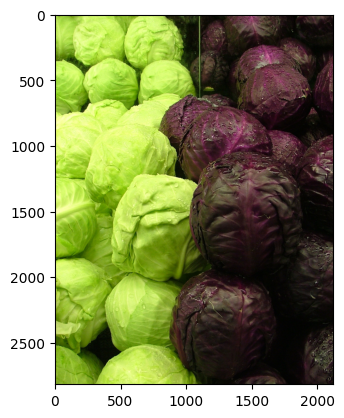

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
image_path = '/content/drive/Shareddrives/big_data/plant_images/Brassica oleracea var. capitata/Cabbages_Green_and_Purple_2120px.jpg'
im= Image.open(image_path)
plt.imshow(im)
plt.show()

In [ ]:
from scipy.spatial import KDTree
from webcolors import (
    CSS3_HEX_TO_NAMES,
    hex_to_rgb,
)
def convert_rgb_to_names(rgb_triplet):

    css3_db = CSS3_HEX_TO_NAMES
    names = []
    rgb_values = []
    for color_hex, color_name in css3_db.items():
        names.append(color_name)
        rgb_values.append(hex_to_rgb(color_hex))

    kdt_db = KDTree(rgb_values)
    distance, index = kdt_db.query(rgb_triplet)
    return names[index]

In [ ]:
import numpy as np
import cv2
from sklearn.cluster import KMeans
from webcolors import rgb_to_name

def extract_power_colors(image_path, num_colors=5):
    image = cv2.imread(image_path)
    if image is None:
      print(f"Failed to load image: {img}")
      return None, None  # Skip this image and move to the next
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    pixels = image.reshape(-1, 3)
    kmeans = KMeans(n_clusters=num_colors)
    kmeans.fit(pixels)
    dominant_colors = kmeans.cluster_centers_
    power_colors = ['#%02x%02x%02x' % (int(color[0]), int(color[1]), int(color[2])) for color in dominant_colors]
    print(power_colors)
    power_colors_rgb = []
    for color in dominant_colors:
        try:
          color_name = convert_rgb_to_names((int(color[0]), int(color[1]), int(color[2])))
        except ValueError:
            color_name = "Unknown"
        power_colors_rgb.append(color_name)
    return power_colors, power_colors_rgb

# image_path = '/content/drive/Shareddrives/big_data/plant_images/Brassica oleracea var. capitata/Cabbages_Green_and_Purple_2120px.jpg'
# power_colors, power_colors_rgb= extract_power_colors(image_path)

# print("Dominant power colors:", power_colors_rgb)

In [ ]:
color_keyword_replacements = {
    "purple": "purple",
    "gray": "gray",
    "red": "red",
    "orange": "orange",
    "yellow": "yellow",
    "green": "green",
    "blue": "blue",
    "pink": "pink",
    "brown": "brown",
    "black": "black",
    "white": "white",
    "tan": "pink",
    "golden": "yellow",
    "khaki":"green"
}
def get_image_colors(power_colors_rgb):
  generic_color_names = []
  for color_info in power_colors_rgb:
      closest_color_name = color_info.split(': ')[-1]
      matching_keyword = next((keyword for keyword in color_keyword_replacements if keyword in closest_color_name.lower()), None)
      if matching_keyword:
          closest_generic_name = color_keyword_replacements[matching_keyword]
      else:
          closest_generic_name = "unknown"
      generic_color_names.append(closest_generic_name)
  return generic_color_names

In [ ]:
import os
import shutil

def copy_directory(src, dest):
    try:
        shutil.copytree(src, dest)
        print(f"Directory '{src}' and its subdirectories copied to '{dest}' successfully.")
    except FileExistsError:
        print(f"Directory '{dest}' already exists. Copy operation aborted.")
    except Exception as e:
        print(f"An error occurred: {e}")

source_directory = "/content/drive/Shareddrives/big_data/plant_images/"
destination_directory = "/content/drive/Shareddrives/big_data/plant_images_copy/"

copy_directory(source_directory, destination_directory)

Directory '/content/drive/Shareddrives/big_data/plant_images/' and its subdirectories copied to '/content/drive/Shareddrives/big_data/plant_images_copy/' successfully.


In [ ]:
import glob
from tqdm import tqdm

data = []
all_colors = set()
image_dir = "/content/drive/Shareddrives/big_data/plant_images_copy/"
for plant_name in tqdm(Database_names['official_name'].tolist()):
    print(plant_name)
    image_path = image_dir + plant_name
    images = glob.glob(image_path + '/*')
    for img in images:
        power_colors, power_colors_rgb = extract_power_colors(img)
        if power_colors_rgb is not None:
          colors = get_image_colors (power_colors_rgb)
          data.append([plant_name, img, power_colors, power_colors_rgb])
          all_colors.update(colors)
# Create a DataFrame from the list of data
columns = ['PlantName', 'ImagePath', 'PowerColors', 'PowerColorsRGB']
df = pd.DataFrame(data, columns=columns)

# Display the DataFrame
print(df)

  0%|          | 0/126 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Aquilegia coerulea


  1%|          | 1/126 [00:06<14:25,  6.93s/it]

['#957958', '#c9b681', '#586a38', '#344d1e', '#a89e25']
Arabidopsis halleri


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
  2%|▏         | 2/126 [02:06<2:31:41, 73.40s/it]

['#70654a', '#8ca2c5', '#d2ceb8', '#342716', '#9a9279']
Amaranthus hypochondriacus


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
  2%|▏         | 3/126 [02:41<1:54:17, 55.76s/it]

['#9e2a4c', '#ced4aa', '#b9d46f', '#1e1e16', '#86a269']
Arabidopsis lyrata
Amborella trichopoda


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
  4%|▍         | 5/126 [04:01<1:34:16, 46.75s/it]

['#3f4723', '#0b0b07', '#7a814e', '#ccbe97', '#596537']
Arabidopsis thaliana col


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
  5%|▍         | 6/126 [04:03<1:08:00, 34.00s/it]

['#7b7255', '#beb5a5', '#45423c', '#a3987a', '#f0e6d8']
Asparagus officinalis


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
  6%|▌         | 7/126 [04:11<52:00, 26.22s/it]  

['#9d9585', '#23251f', '#94c6ed', '#5d5e4c', '#549de1']
Musa acuminata


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
  6%|▋         | 8/126 [05:33<1:24:01, 42.72s/it]

['#848a69', '#3e442f', '#f2f3f0', '#63713d', '#b4b7aa']
Brassica oleracea var. capitata


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
  7%|▋         | 9/126 [05:40<1:02:42, 32.16s/it]

['#959a83', '#5e6351', '#3c4334', '#797e6a', '#bdc49f']
Brassica oleracea var. oleracea


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


['#68882c', '#435643', '#c0d589', '#99b351', '#34560e']


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


['#e8f2c3', '#253515', '#91a163', '#586736', '#bcd193']


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


['#f8f8f1', '#525a54', '#878a79', '#c1c2a7', '#242a28']


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


['#72717b', '#918b91', '#574033', '#e59c45', '#b7aeaa']


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


['#757249', '#2c3516', '#bce052', '#648213', '#91a87a']


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


['#3e413a', '#a88a92', '#685f61', '#cec2bc', '#1e1b17']


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


['#718961', '#b2cd9b', '#2a3722', '#516641', '#90a77d']


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


['#68866c', '#1d2d1d', '#415b47', '#b2ccab', '#8aa78c']


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


['#575451', '#909ea8', '#2f2d28', '#6f787b', '#bec9d7']


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


['#819e78', '#0e130c', '#2f5026', '#bed2c2', '#55803e']


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


['#be9162', '#312913', '#87733a', '#e2c494', '#645e23']


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


['#253d1b', '#99ad95', '#556c4e', '#7d8f78', '#bdccb7']


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
  8%|▊         | 10/126 [12:57<4:54:36, 152.39s/it]

['#575d3d', '#cdf3f6', '#313d26', '#787c58', '#9aad8c']
Failed to load image: /content/drive/Shareddrives/big_data/plant_images_copy/Brassica oleracea var. oleracea/Cabbage_-_Indian_Botanic_Garden_-_Howrah_2012-01-29_1733.jpg
Failed to load image: /content/drive/Shareddrives/big_data/plant_images_copy/Brassica oleracea var. oleracea/Brassica_oleracea_convar._capitata_var._alba,_spitskool_(1).jpg
Failed to load image: /content/drive/Shareddrives/big_data/plant_images_copy/Brassica oleracea var. oleracea/Blauer_stangenkohl.jpg
Failed to load image: /content/drive/Shareddrives/big_data/plant_images_copy/Brassica oleracea var. oleracea/Broccoflower.jpg
Failed to load image: /content/drive/Shareddrives/big_data/plant_images_copy/Brassica oleracea var. oleracea/Kalettes_stem_and_indivisual.jpg
Failed to load image: /content/drive/Shareddrives/big_data/plant_images_copy/Brassica oleracea var. oleracea/Collard_greens_in_Galicia,_Spain.jpg
Failed to load image: /content/drive/Shareddrives/big_d

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
  9%|▊         | 11/126 [13:22<3:39:16, 114.40s/it]

['#030302', '#7d994b', '#e7edd0', '#535b37', '#aebf84']
Brassica rapa FPsc


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 10%|▉         | 12/126 [13:24<2:33:59, 81.05s/it] 

['#778338', '#131a05', '#eaea74', '#afb355', '#49561b']
Triticum aestivum


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 10%|█         | 13/126 [13:56<2:04:29, 66.10s/it]

['#91934a', '#373e15', '#7b8309', '#c2bf85', '#596022']
Boechera stricta


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 11%|█         | 14/126 [14:09<1:33:52, 50.29s/it]

['#8a9881', '#3f3534', '#2b1216', '#5b555c', '#e8e7d4']
Camptotheca acuminata


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 12%|█▏        | 15/126 [14:57<1:31:39, 49.55s/it]

['#515b69', '#497ece', '#dbdcda', '#272c2c', '#9f9d9c']
Capsicum annuum


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 13%|█▎        | 16/126 [15:36<1:25:08, 46.44s/it]

['#792610', '#bb8d57', '#9a6a3a', '#3c0d03', '#daae77']
Cicer arietinum ICC4958
Dianthus caryophyllus


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 14%|█▍        | 18/126 [15:39<46:18, 25.72s/it]  

['#bec096', '#be1322', '#657346', '#839768', '#da4a54']
Daucus carota subsp. Sativus


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 15%|█▌        | 19/126 [15:49<39:10, 21.96s/it]

['#b9ab93', '#67583e', '#948d68', '#deccc4', '#3d352d']
Anacardium occidentale


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 16%|█▌        | 20/126 [16:26<45:29, 25.75s/it]

['#799e1d', '#87a377', '#eff9eb', '#4b5531', '#d1b72d']
Manihot esculenta esculenta


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 17%|█▋        | 21/126 [16:41<39:49, 22.75s/it]

['#6f8d3d', '#b8db7c', '#4d6d25', '#90b259', '#2b410f']
Ricinus communis


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 17%|█▋        | 22/126 [18:06<1:10:03, 40.42s/it]

['#303e15', '#6d786e', '#1a1807', '#c2b399', '#585433']
Cuscuta campestris
Corchorus capsularis


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 19%|█▉        | 24/126 [19:53<1:18:15, 46.04s/it]

['#546e41', '#90ce78', '#74a157', '#32392c', '#bce1ae']
Calotropis gigantea


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 20%|█▉        | 25/126 [20:14<1:07:43, 40.23s/it]

['#5f6934', '#dae6c7', '#a7a975', '#818652', '#3b4721']
Capsella grandiflora
Brassica rapa ssp. pekinensis


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 21%|██▏       | 27/126 [22:29<1:24:32, 51.24s/it]

['#9da05b', '#c0b996', '#2b340d', '#6b7630', '#dfd4c9']
Chlamydomonas reinhardtii
Citrus clementina


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 23%|██▎       | 29/126 [22:30<52:47, 32.66s/it]  

['#e7d8cd', '#3b4931', '#e3701a', '#5e7335', '#b6411f']
Theobroma cacao


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 24%|██▍       | 30/126 [24:17<1:16:57, 48.10s/it]

['#918e5f', '#e1f2ed', '#0f2903', '#74a005', '#5d4d0a']
Phaseolus vulgaris


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 25%|██▍       | 31/126 [24:41<1:07:17, 42.50s/it]

['#243a12', '#597e29', '#9bbb59', '#3b6019', '#799e3b']
Quercus suber


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 25%|██▌       | 32/126 [24:48<52:53, 33.76s/it]  

['#1b190e', '#a7966f', '#443a2a', '#e0cdb2', '#785d45']
Zeamays mays


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 26%|██▌       | 33/126 [25:17<50:21, 32.49s/it]

['#5d5402', '#fac305', '#fedb98', '#aa8c01', '#20170a']
Catharanthus roseus


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 27%|██▋       | 34/126 [26:54<1:16:36, 49.96s/it]

['#4f3f0b', '#ecd9bb', '#232003', '#84692f', '#c3ab85']
Capsella rubella


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 28%|██▊       | 35/126 [28:44<1:41:26, 66.89s/it]

['#918c82', '#b9b4af', '#595145', '#7a7266', '#a59f99']
Cannabis sativa Purple Kush


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 29%|██▊       | 36/126 [30:19<1:52:23, 74.92s/it]

['#75b464', '#284225', '#c2e4c3', '#4c7744', '#94c991']
Coccomyxa subellipsoidea C-169
Cucumis sativus


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 30%|███       | 38/126 [30:36<1:05:55, 44.95s/it]

['#9dc480', '#c9eca8', '#8cac66', '#acd99c', '#797e48']
Chlorella variabilis NC64A
Chromochloris zofingiensis


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


['#a3ab9d', '#525d35', '#d1d7bd', '#abb053', '#7c8777']


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


['#0c1c07', '#c1b6ab', '#686051', '#f0ebe3', '#978a7c']


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 32%|███▏      | 40/126 [33:21<1:25:38, 59.75s/it]

['#e5e6e4', '#4e5e2b', '#78825a', '#c3c5c0', '#aeb1a2']
Phoenix dactylifera


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 33%|███▎      | 41/126 [34:24<1:25:26, 60.31s/it]

['#3e180b', '#e4e7ef', '#906e34', '#773d17', '#ac9f83']
Dioscorea rotundata
Solanum melongena


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 34%|███▍      | 43/126 [35:58<1:16:32, 55.33s/it]

['#819d3f', '#36340b', '#5c6b1f', '#d2e4af', '#a1b978']
Eucalyptus grandis


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 35%|███▍      | 44/126 [36:08<1:02:17, 45.58s/it]

['#3f423b', '#7698ed', '#e9e3e1', '#939592', '#6b6e62']
Eutrema salsugineum
Pyrus communis


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 37%|███▋      | 46/126 [40:50<1:49:07, 81.85s/it]

['#7b7f51', '#a2a883', '#252f13', '#d9d9d3', '#51592e']
Linum usitatissimum


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 37%|███▋      | 47/126 [41:05<1:28:53, 67.51s/it]

['#9799ca', '#070b03', '#414546', '#6163c3', '#272c1a']
Fragaria vesca subsp. Vesca


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 38%|███▊      | 48/126 [41:33<1:15:45, 58.27s/it]

['#b9c436', '#2a260e', '#928b3e', '#d5d167', '#595225']
Ginkgo biloba


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 39%|███▉      | 49/126 [43:25<1:32:14, 71.87s/it]

['#557bc5', '#3c2a13', '#c9c1b4', '#966e26', '#eac543']
Gossypium raimondii
Vitis vinifera


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 40%|████      | 51/126 [43:31<53:42, 42.97s/it]  

['#1f1a16', '#cecc62', '#98a02e', '#5f5c29', '#8b7c91']
Humulus lupulus


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 41%|████▏     | 52/126 [43:51<46:41, 37.86s/it]

['#486321', '#a6bd6f', '#1b2814', '#d8e4ce', '#769344']
Kalanchoe fedtschenkoi


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 42%|████▏     | 53/126 [44:08<39:44, 32.66s/it]

['#e7c2cd', '#60593d', '#ba9093', '#27241a', '#8e7167']
Kalanchoe laxiflora


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 43%|████▎     | 54/126 [44:12<30:12, 25.17s/it]

['#383225', '#825c5a', '#a28989', '#ed7d96', '#e9226c']
Arabidopsis thaliana Ler


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 44%|████▎     | 55/126 [44:15<22:43, 19.20s/it]

['#a3987a', '#45433c', '#beb5a5', '#7b7355', '#f0e6d8']
Lactuca sativa


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 44%|████▍     | 56/126 [44:22<18:22, 15.75s/it]

['#5e5755', '#c9b285', '#9d896c', '#4a4342', '#ddd1bb']
Lotus japonicus
Leersia perrieri


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 46%|████▌     | 58/126 [44:34<12:56, 11.42s/it]

['#9cb14d', '#e7eee7', '#687f1b', '#82a02e', '#c2c787']
Musa balbisiana


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 47%|████▋     | 59/126 [44:45<12:33, 11.24s/it]

['#979255', '#c5c3c6', '#675728', '#b7ac8c', '#c9d2e8']
Micromonas commoda RCC299
Malus domestica


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 48%|████▊     | 61/126 [45:15<13:56, 12.87s/it]

['#7d9441', '#edf2f2', '#504a1d', '#ca5052', '#a5b08c']
Mimulus guttatus
Phyllostachys edulis


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 50%|█████     | 63/126 [45:21<09:41,  9.22s/it]

['#7d8170', '#303324', '#53544a', '#597921', '#b3b1b8']
Physcomitrella patens


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 51%|█████     | 64/126 [45:25<08:20,  8.08s/it]

['#5f6b13', '#b4bb7a', '#2f280c', '#81853b', '#445206']
Marchantia polymorpha


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 52%|█████▏    | 65/126 [45:53<12:49, 12.62s/it]

['#76976a', '#364d1c', '#56723f', '#9ebf9a', '#121d07']
Micromonas pusilla CCMP1545
Miscanthus sinensis


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 53%|█████▎    | 67/126 [46:00<08:52,  9.02s/it]

['#6d7949', '#21220d', '#bdcba5', '#485128', '#919e71']
Medicago truncatula
Cucumis melo


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 55%|█████▍    | 69/126 [46:37<11:52, 12.51s/it]

['#95a988', '#26341e', '#525b3c', '#c7cfbc', '#68845d']
Nicotiana tabacum TN90


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 56%|█████▌    | 70/126 [46:39<09:35, 10.27s/it]

['#787b74', '#b0b3af', '#c0c4c3', '#999a91', '#5f625c']
Oryza barthii
Oryza brachyantha
Olea europaea var. sylvestris


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 58%|█████▊    | 73/126 [46:43<05:24,  6.13s/it]

['#524b30', '#ece4d4', '#81775d', '#19200a', '#b9ad90']
Oryza glaberrima


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 59%|█████▊    | 74/126 [46:45<04:37,  5.34s/it]

['#5a6f27', '#d9e6fa', '#2e4507', '#a9b4a2', '#7e8e54']
Elaeis guineensis


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 60%|█████▉    | 75/126 [47:00<06:15,  7.36s/it]

['#928861', '#bfc293', '#31281a', '#64543b', '#f3f6e5']
Brassica napus


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 60%|██████    | 76/126 [47:13<07:12,  8.66s/it]

['#92a4ea', '#2d2d23', '#e9e20f', '#b5a807', '#7f710b']
Oryza longistaminata
Ostreococcus lucimarinus
Oryza meridionalis
Oryza nivara
Oryza punctata
Oryza rufipogon
Oryza sativa japonica group
Oropetium thomaeum
Carica papaya


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 67%|██████▋   | 85/126 [47:29<02:23,  3.51s/it]

['#2c2a15', '#fdfdfd', '#a79c6f', '#98480f', '#60613a']
Petunia axillaris
Panicum hallii
Cajanus Cajan


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 70%|██████▉   | 88/126 [48:06<03:42,  5.85s/it]

['#34380a', '#d9ca53', '#606518', '#92912e', '#f5efc0']
Ananas comosus


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 71%|███████   | 89/126 [48:26<04:34,  7.41s/it]

['#fdfdfd', '#8b7e56', '#4e4220', '#e6dfc9', '#c1b287']
Populus trichocarpa, other Populus species and hybrids


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 71%|███████▏  | 90/126 [49:26<08:47, 14.65s/it]

['#253421', '#657456', '#d8ceb2', '#455836', '#8f977e']
Solanum tuberosum


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 72%|███████▏  | 91/126 [49:57<10:04, 17.27s/it]

['#8a8280', '#283527', '#b7a5ae', '#495c43', '#dfa70e']
Prunus persica


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 73%|███████▎  | 92/126 [51:44<19:26, 34.30s/it]

['#a3ae8a', '#39452a', '#d8d7d0', '#66933e', '#836a64']
Chenopodium quinoa


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 74%|███████▍  | 93/126 [52:02<16:52, 30.69s/it]

['#924324', '#f5f3ef', '#5c1f12', '#ccaa88', '#af7350']
Rosa chinensis


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 75%|███████▍  | 94/126 [52:11<13:40, 25.65s/it]

['#c4aa90', '#a3926f', '#837753', '#55513c', '#f0bfd6']
Trifolium pratense


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 75%|███████▌  | 95/126 [54:42<29:29, 57.07s/it]

['#3c6816', '#c6b55d', '#9e9e38', '#e287c6', '#a84383']
Salvia miltiorrhiza Bunge


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 76%|███████▌  | 96/126 [54:50<22:03, 44.11s/it]

['#989797', '#757949', '#474b25', '#8c8989', '#bcb7d2']
Rosa multiflora


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 77%|███████▋  | 97/126 [56:00<24:45, 51.22s/it]

['#cecfd0', '#233218', '#737748', '#b5b2a6', '#425627']
Hevea brasiliensis


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 78%|███████▊  | 98/126 [57:13<26:45, 57.35s/it]

['#c9d1d8', '#28251a', '#8ba4bb', '#544b44', '#9f7a60']
Nelumbo nucifera


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 79%|███████▊  | 99/126 [58:09<25:38, 57.00s/it]

['#f0d9dd', '#3c561a', '#60766b', '#182310', '#bba1a3']
Selaginella moellendorffii


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 79%|███████▉  | 100/126 [58:13<18:02, 41.65s/it]

['#648d27', '#84aa48', '#1a2f0a', '#a6c974', '#3f6615']
Setaria italica


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 80%|████████  | 101/126 [1:00:25<28:20, 68.01s/it]

['#38550f', '#c3ce96', '#5f7921', '#1a3205', '#8d9d58']
Sphagnum fallax
Spinacia oleracea


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 82%|████████▏ | 103/126 [1:00:29<14:32, 37.94s/it]

['#628f56', '#b3d9a9', '#30591e', '#83b07b', '#4b7d2e']
Sorghum bicolor


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 83%|████████▎ | 104/126 [1:00:45<11:56, 32.57s/it]

['#63622b', '#a7daf7', '#252114', '#d1d293', '#9b9e52']
Glycine max


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 83%|████████▎ | 105/126 [1:01:05<10:16, 29.38s/it]

['#35481e', '#bcd4a2', '#182111', '#95a36c', '#617240']
Solanum pennellii
Tarenaya hassleriana


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 85%|████████▍ | 107/126 [1:01:23<06:32, 20.67s/it]

['#121d08', '#ab547b', '#774331', '#d183c2', '#2c4018']
Spirodela polyrhiza


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 86%|████████▌ | 108/126 [1:01:27<04:59, 16.62s/it]

['#3d7244', '#539062', '#c3dfe3', '#162d2b', '#77ac91']
Senna tora
Beta vulgaris subsp. vulgaris


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 87%|████████▋ | 110/126 [1:02:31<06:05, 22.87s/it]

['#fefefe', '#5b492e', '#7b7e39', '#28230e', '#a38c6b']
Helianthus annuus


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 88%|████████▊ | 111/126 [1:03:14<06:50, 27.38s/it]

['#2a3d07', '#fcbf02', '#7c943e', '#4f6b16', '#c87703']
Setaria viridis


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 89%|████████▉ | 112/126 [1:03:47<06:40, 28.63s/it]

['#394e23', '#738b51', '#afb997', '#5a7436', '#8ea26e']
Prunis avium


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 90%|████████▉ | 113/126 [1:08:31<20:23, 94.11s/it]

['#dbc299', '#411e0a', '#abbe21', '#ce1b2c', '#636020']
Citrus sinensis


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 90%|█████████ | 114/126 [1:08:33<13:54, 69.50s/it]

['#4a4c19', '#cd8309', '#e7e5e5', '#7c8a66', '#161a0c']
Panicum virgatum


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 91%|█████████▏| 115/126 [1:09:29<12:02, 65.65s/it]

['#8da792', '#435e45', '#65826a', '#bacebd', '#243523']
Camellia sinensis


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 92%|█████████▏| 116/126 [1:12:18<15:48, 94.81s/it]

['#6c764b', '#16150e', '#c3bdb3', '#8e9a89', '#46442c']
Solanum lycopersicum


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 93%|█████████▎| 117/126 [1:12:31<10:41, 71.31s/it]

['#3b7127', '#090e0c', '#84030f', '#7faa37', '#eb251b']
Thellungiella parvula
Quercus lobata


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 94%|█████████▍| 119/126 [1:13:56<06:48, 58.37s/it]

['#e6dbc6', '#464b50', '#191e25', '#b2a28f', '#677180']
Volvox carteri
Citrullus lanatus


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 96%|█████████▌| 121/126 [1:14:46<03:46, 45.28s/it]

['#8ea87b', '#173606', '#3d6214', '#6a8a40', '#d4d767']
Triticum urartu
Aegilops tauschii


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 98%|█████████▊| 123/126 [1:14:49<01:28, 29.55s/it]

['#8696a0', '#758284', '#e6b12a', '#646c62', '#a5b2bf']
Saccharum spontanaeum


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 98%|█████████▊| 124/126 [1:15:57<01:14, 37.38s/it]

['#d7e0f0', '#72683a', '#a49b70', '#352d13', '#ccc6b0']
Zostera marina
Hordeum vulgare


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
100%|██████████| 126/126 [1:16:05<00:00, 36.23s/it]

['#99651a', '#310c01', '#f3ce6d', '#653404', '#c49335']
                      PlantName  \
0            Aquilegia coerulea   
1           Arabidopsis halleri   
2    Amaranthus hypochondriacus   
3          Amborella trichopoda   
4      Arabidopsis thaliana col   
..                          ...   
101              Quercus lobata   
102           Citrullus lanatus   
103           Aegilops tauschii   
104       Saccharum spontanaeum   
105             Hordeum vulgare   

                                             ImagePath  \
0    /content/drive/Shareddrives/big_data/plant_ima...   
1    /content/drive/Shareddrives/big_data/plant_ima...   
2    /content/drive/Shareddrives/big_data/plant_ima...   
3    /content/drive/Shareddrives/big_data/plant_ima...   
4    /content/drive/Shareddrives/big_data/plant_ima...   
..                                                 ...   
101  /content/drive/Shareddrives/big_data/plant_ima...   
102  /content/drive/Shareddrives/big_data/plant_ima...   
1

In [ ]:
df.to_csv('/content/drive/Shareddrives/big_data/images_colors_df.csv')

In [ ]:
color_keyword_replacements = {
    "purple": "purple",
    "gray": "gray",
    "red": "red",
    "orange": "orange",
    "yellow": "yellow",
    "green": "green",
    "blue": "blue",
    "pink": "pink",
    "brown": "brown",
    "black": "black",
    "white": "white",
    "tan": "pink",
    "golden": "yellow",
    "khaki":"green",
    "olive":"green",
    "sienna":"red",
    "lavender":"purple",
    "maroon":"red",
    "crimson":"red",
    "orchid":"purple",
    "indianred":"red",
    "rose":"pink"

}
def get_image_colors(power_colors_rgb):
  generic_color_names = []
  for color_info in power_colors_rgb:
      closest_color_name = color_info.split(': ')[-1]
      matching_keyword = next((keyword for keyword in color_keyword_replacements if keyword in closest_color_name.lower()), None)
      if matching_keyword:
          closest_generic_name = color_keyword_replacements[matching_keyword]
      else:
          closest_generic_name = "unknown"
      generic_color_names.append(closest_generic_name)
  return generic_color_names

In [ ]:
df["Color_Keyword"] = df["PowerColorsRGB"].apply(get_image_colors)
df

,PlantName,ImagePath,PowerColors,PowerColorsRGB,Color_Keyword
0,Aquilegia coerulea,/content/drive/Shareddrives/big_data/plant_ima...,"[#957958, #c9b681, #586a38, #344d1e, #a89e25]","[gray, tan, darkolivegreen, darkolivegreen, da...","[gray, pink, green, green, yellow]"
1,Arabidopsis halleri,/content/drive/Shareddrives/big_data/plant_ima...,"[#70654a, #8ca2c5, #d2ceb8, #342716, #9a9279]","[dimgray, darkgray, silver, black, gray]","[gray, gray, unknown, black, gray]"
2,Amaranthus hypochondriacus,/content/drive/Shareddrives/big_data/plant_ima...,"[#9e2a4c, #ced4aa, #b9d46f, #1e1e16, #86a269]","[brown, silver, darkkhaki, black, gray]","[brown, unknown, green, black, gray]"
3,Amborella trichopoda,/content/drive/Shareddrives/big_data/plant_ima...,"[#3f4723, #0b0b07, #7a814e, #ccbe97, #596537]","[darkolivegreen, black, dimgray, tan, darkoliv...","[green, black, gray, pink, green]"
4,Arabidopsis thaliana col,/content/drive/Shareddrives/big_data/plant_ima...,"[#7b7255, #beb5a5, #45423c, #a3987a, #f0e6d8]","[dimgray, darkgray, darkslategray, rosybrown, ...","[gray, gray, gray, brown, white]"
...,...,...,...,...,...
101,Quercus lobata,/content/drive/Shareddrives/big_data/plant_ima...,"[#e6dbc6, #464b50, #191e25, #b2a28f, #677180]","[gainsboro, darkslategray, black, rosybrown, s...","[unknown, gray, black, brown, gray]"
102,Citrullus lanatus,/content/drive/Shareddrives/big_data/plant_ima...,"[#8ea87b, #173606, #3d6214, #6a8a40, #d4d767]","[darkseagreen, darkgreen, darkolivegreen, oliv...","[green, green, green, green, green]"
103,Aegilops tauschii,/content/drive/Shareddrives/big_data/plant_ima...,"[#8696a0, #758284, #e6b12a, #646c62, #a5b2bf]","[lightslategray, gray, goldenrod, dimgray, dar...","[gray, gray, yellow, gray, gray]"
104,Saccharum spontanaeum,/content/drive/Shareddrives/big_data/plant_ima...,"[#d7e0f0, #72683a, #a49b70, #352d13, #ccc6b0]","[lavender, darkolivegreen, darkkhaki, darkslat...","[purple, green, green, gray, unknown]"


In [ ]:
df.to_csv('/content/drive/Shareddrives/big_data/images_colors_df_keywords.csv')

In [ ]:
df_colors = df[['PlantName','Color_Keyword']]
df_colors

,PlantName,Color_Keyword
0,Aquilegia coerulea,"[gray, pink, green, green, yellow]"
1,Arabidopsis halleri,"[gray, gray, unknown, black, gray]"
2,Amaranthus hypochondriacus,"[brown, unknown, green, black, gray]"
3,Amborella trichopoda,"[green, black, gray, pink, green]"
4,Arabidopsis thaliana col,"[gray, gray, gray, brown, white]"
...,...,...
101,Quercus lobata,"[unknown, gray, black, brown, gray]"
102,Citrullus lanatus,"[green, green, green, green, green]"
103,Aegilops tauschii,"[gray, gray, yellow, gray, gray]"
104,Saccharum spontanaeum,"[purple, green, green, gray, unknown]"


In [ ]:
df_final_combined_colors = df_final_combined.merge(df_colors, how='left', left_on=['species_y'], right_on=['PlantName'])

In [ ]:
numeric_columns = df_final_combined_colors.select_dtypes(include=["number"]).columns
numeric_columns

Index(['(8Z,11Z,14Z,17Z)-3-oxoicosatetraenoyl-CoA',
       '4-hydroxy-3-decaprenylbenzoate', 'tomatid-4-en-3-one', '1-pyrroline',
       'cathenamine', 'hydroxylamine', 'L-homomethionine',
       '2-methylfumaryl-CoA', '(-)-endo-alpha-bergamotene',
       'gibberellin A15 (open lactone form)',
       ...
       '2-(cystein-S-yl)-2-(1H-indol-3-yl)-acetonitrile',
       'an N-terminal-L-methionyl-L-cysteinyl-[protein]',
       '3-(methylsulfanyl)propyl-desulfoglucosinolate', 'strictosamide',
       'caffeoylserotonin', 'soyasapogenol B-3-O-beta-D-glucoside',
       'Unnamed: 0.2', 'Unnamed: 0.1', 'Unnamed: 0', 'wikiPageLength'],
      dtype='object', length=3661)

In [ ]:
columns_to_keep = ["PlantName", "Color_Keyword"] + list(numeric_columns)
df_numeric = df_final_combined_colors[columns_to_keep]
substring_to_drop = "wiki"
columns_to_drop = df_numeric.filter(like=substring_to_drop).columns
df_numeric = df_numeric.drop(columns=columns_to_drop)
substring_to_drop = "Unnamed"
columns_to_drop = df_numeric.filter(like=substring_to_drop).columns
df_numeric = df_numeric.drop(columns=columns_to_drop)
df_numeric.dropna(inplace=True)
df_numeric

,PlantName,Color_Keyword,"(8Z,11Z,14Z,17Z)-3-oxoicosatetraenoyl-CoA",4-hydroxy-3-decaprenylbenzoate,tomatid-4-en-3-one,1-pyrroline,cathenamine,hydroxylamine,L-homomethionine,2-methylfumaryl-CoA,...,acibenzolar-S-methyl,2'-hydroxypseudobaptigenin,"Man8(GlcNAc)2-[protein] (isomer 8A1,2,3B1,3)","1,6-kestotetraose",2-(cystein-S-yl)-2-(1H-indol-3-yl)-acetonitrile,an N-terminal-L-methionyl-L-cysteinyl-[protein],3-(methylsulfanyl)propyl-desulfoglucosinolate,strictosamide,caffeoylserotonin,soyasapogenol B-3-O-beta-D-glucoside
0,Aquilegia coerulea,"[gray, pink, green, green, yellow]",0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
1,Arabidopsis halleri,"[gray, gray, unknown, black, gray]",0,0,0,1,0,0,1,0,...,1,0,0,0,0,0,1,0,0,0
2,Amaranthus hypochondriacus,"[brown, unknown, green, black, gray]",0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,Amborella trichopoda,"[green, black, gray, pink, green]",0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
6,Asparagus officinalis,"[brown, black, blue, green, blue]",0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119,Camellia sinensis,"[gray, black, unknown, gray, green]",0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
120,Solanum lycopersicum,"[green, black, red, green, red]",0,0,1,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
122,Quercus lobata,"[unknown, gray, black, brown, gray]",0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
124,Citrullus lanatus,"[green, green, green, green, green]",0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0


In [ ]:
df_numeric['has_red_pink'] = df_numeric['Color_Keyword'].apply(lambda colors: any(color in ['red', 'pink'] for color in colors)).astype(int)
df_numeric.head()

,PlantName,Color_Keyword,"(8Z,11Z,14Z,17Z)-3-oxoicosatetraenoyl-CoA",4-hydroxy-3-decaprenylbenzoate,tomatid-4-en-3-one,1-pyrroline,cathenamine,hydroxylamine,L-homomethionine,2-methylfumaryl-CoA,...,2'-hydroxypseudobaptigenin,"Man8(GlcNAc)2-[protein] (isomer 8A1,2,3B1,3)","1,6-kestotetraose",2-(cystein-S-yl)-2-(1H-indol-3-yl)-acetonitrile,an N-terminal-L-methionyl-L-cysteinyl-[protein],3-(methylsulfanyl)propyl-desulfoglucosinolate,strictosamide,caffeoylserotonin,soyasapogenol B-3-O-beta-D-glucoside,has_red_pink
0,Aquilegia coerulea,"[gray, pink, green, green, yellow]",0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,Arabidopsis halleri,"[gray, gray, unknown, black, gray]",0,0,0,1,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
2,Amaranthus hypochondriacus,"[brown, unknown, green, black, gray]",0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Amborella trichopoda,"[green, black, gray, pink, green]",0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
6,Asparagus officinalis,"[brown, black, blue, green, blue]",0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
df_numeric['has_red_pink'].value_counts()

0    49
1    25
Name: has_red_pink, dtype: int64

In [ ]:
columns_to_drop = ['PlantName', 'Color_Keyword']
df_color_prefict = df_numeric.drop(columns=columns_to_drop)
df_color_prefict.head()

,"(8Z,11Z,14Z,17Z)-3-oxoicosatetraenoyl-CoA",4-hydroxy-3-decaprenylbenzoate,tomatid-4-en-3-one,1-pyrroline,cathenamine,hydroxylamine,L-homomethionine,2-methylfumaryl-CoA,(-)-endo-alpha-bergamotene,gibberellin A15 (open lactone form),...,2'-hydroxypseudobaptigenin,"Man8(GlcNAc)2-[protein] (isomer 8A1,2,3B1,3)","1,6-kestotetraose",2-(cystein-S-yl)-2-(1H-indol-3-yl)-acetonitrile,an N-terminal-L-methionyl-L-cysteinyl-[protein],3-(methylsulfanyl)propyl-desulfoglucosinolate,strictosamide,caffeoylserotonin,soyasapogenol B-3-O-beta-D-glucoside,has_red_pink
0,0,0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
1,0,0,0,1,0,0,1,0,0,1,...,0,0,0,0,0,1,0,0,0,0
2,0,0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
6,0,0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


Predict if has red or pink color in the image from the metalic data

In [ ]:
y = df_color_prefict['has_red_pink']

columns_to_drop = ['has_red_pink']
X = df_color_prefict.drop(columns=columns_to_drop)

In [ ]:
!pip install catboost
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.6/98.6 MB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 6.7 MB/s eta 0:00:00


In [ ]:
from sklearn.model_selection import train_test_split
from catboost import CatBoostClassifier
import shap
from sklearn.metrics import roc_auc_score, average_precision_score
from sklearn import metrics

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, shuffle=True, stratify=y)
model = CatBoostClassifier(
    verbose=True,
    iterations=20
)
model.fit(X_train, y_train)

Learning rate set to 0.104477
0:	learn: 0.6446516	total: 167ms	remaining: 3.17s
1:	learn: 0.5912464	total: 332ms	remaining: 2.98s
2:	learn: 0.5626711	total: 430ms	remaining: 2.44s
3:	learn: 0.5243519	total: 615ms	remaining: 2.46s
4:	learn: 0.4966077	total: 800ms	remaining: 2.4s
5:	learn: 0.4733948	total: 955ms	remaining: 2.23s
6:	learn: 0.4354670	total: 1.11s	remaining: 2.06s
7:	learn: 0.3993125	total: 1.28s	remaining: 1.92s
8:	learn: 0.3692138	total: 1.36s	remaining: 1.66s
9:	learn: 0.3596506	total: 1.52s	remaining: 1.52s
10:	learn: 0.3481780	total: 1.69s	remaining: 1.38s
11:	learn: 0.3264039	total: 1.86s	remaining: 1.24s
12:	learn: 0.3108483	total: 2s	remaining: 1.08s
13:	learn: 0.2920432	total: 2.13s	remaining: 913ms
14:	learn: 0.2787684	total: 2.28s	remaining: 760ms
15:	learn: 0.2628021	total: 2.43s	remaining: 608ms
16:	learn: 0.2526430	total: 2.56s	remaining: 452ms
17:	learn: 0.2437979	total: 2.71s	remaining: 301ms
18:	learn: 0.2298615	total: 2.85s	remaining: 150ms
19:	learn: 0.22


train auc 1.0
test auc 0.6833333333333333
train prauc 1.0
test prauc 0.5349476911976911


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


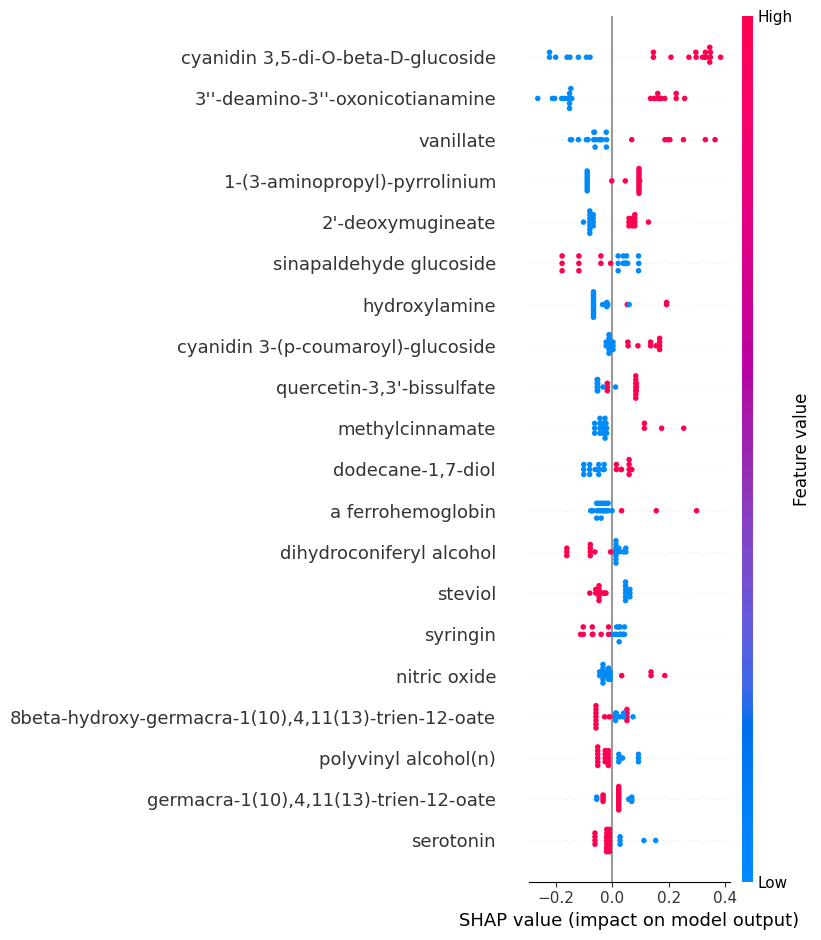

In [ ]:
print('\ntrain auc', roc_auc_score(y_train, model.predict_proba(X_train)[:, 1]))
print('test auc', roc_auc_score(y_test, model.predict_proba(X_test)[:, 1]))

print('train prauc', average_precision_score(y_train, model.predict_proba(X_train)[:, 1]))
print('test prauc', average_precision_score(y_test, model.predict_proba(X_test)[:, 1]))

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

#Entities

In [ ]:
!python -m spacy download en_core_web_lg

In [ ]:
Database_names.columns

Index(['Database Name', 'Link to Table', 'link_to_pgdb', 'official_name',
       'compound_name', 'label', 'comment', 'genus', 'species',
       'wikiPageLength', 'wiki_full_text'],
      dtype='object')

In [ ]:
import en_core_web_lg
import spacy
from spacy import displacy
import en_core_web_sm

nlp = en_core_web_lg.load()
doc = nlp(Database_names['comment'][0])
displacy.render(doc, style='ent', jupyter=True)

In [ ]:
doc = nlp(Database_names['comment'][2])
displacy.render(doc, style='ent', jupyter=True)

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
from geopy.geocoders import Nominatim

In [ ]:
Database_names.head()

,Database Name,Link to Table,link_to_pgdb,official_name,compound_name,label,comment,genus,species,wikiPageLength
0,PlantCyc 15.2.0,https://plantcyc.org/content/plantcyc-15.2.0,http://pmn.plantcyc.org/organism-summary?objec...,primarily Viridiplantae,plantcyc,Viridiplantae,"Viridiplantae (literally ""green plants"") are a...",None,None,18776
1,AcoeruleaCyc 2.0.2,https://plantcyc.org/content/acoeruleacyc-2.0.2,http://pmn.plantcyc.org/organism-summary?objec...,Aquilegia coerulea,acoeruleacyc,Aquilegia coerulea,"Aquilegia coerulea, the Colorado blue columbin...",Aquilegia,coerulea,4283
2,AhalleriCyc 4.0.0,https://plantcyc.org/content/ahallericyc-4.0.0,http://pmn.plantcyc.org/organism-summary?objec...,Arabidopsis halleri,ahallericyc,Arabidopsis,Arabidopsis (rockcress) is a genus in the fami...,None,None,22080
3,AhypochondriacusCyc 3.0.2,https://plantcyc.org/content/ahypochondriacusc...,http://pmn.plantcyc.org/organism-summary?objec...,Amaranthus hypochondriacus,ahypochondriacuscyc,Amaranthus hypochondriacus,Amaranthus hypochondriacus is an ornamental pl...,Amaranthus,hypochondriacus,8505
4,AlyrataCyc 3.0.2,https://plantcyc.org/content/alyratacyc-3.0.2,http://pmn.plantcyc.org/organism-summary?objec...,Arabidopsis lyrata,alyratacyc,Arabidopsis lyrata,Arabidopsis lyrata is a species of flowering p...,Arabidopsis,lyrata,10729


<ipython-input-145-42eaa8a19871>:13: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


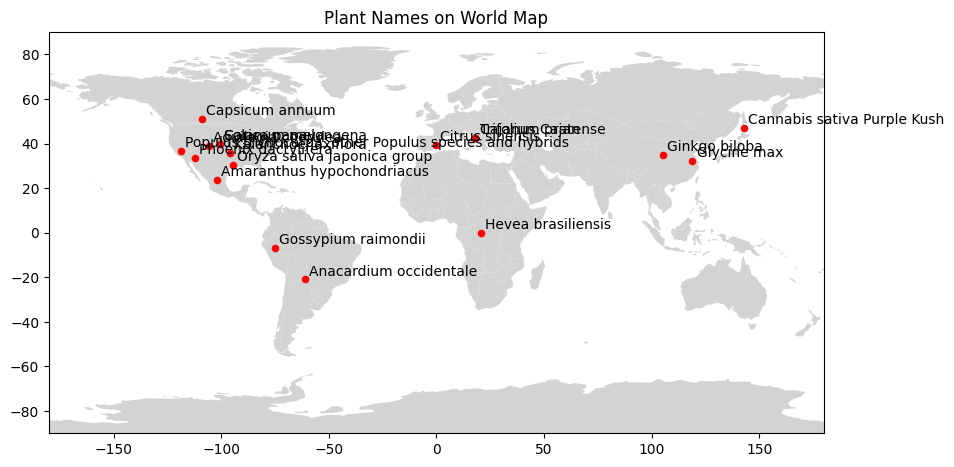

In [ ]:
gpe_entities = []

for index, row in Database_names.iterrows():
  doc = nlp(row.wiki_full_text)
  for ent in doc.ents:
    if ent.label_ == "GPE" or ent.label_ == "LOC":
      gpe_entities.append({"PlantName": row.official_name, "Entity": ent.text})
    break

geolocator = Nominatim(user_agent="plant_mapping")
geometry = []
valid_gpe_entities = []
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

for entity in gpe_entities:
    try:
        location = geolocator.geocode(entity["Entity"])
        if location:
            geometry.append(Point(location.longitude, location.latitude))
            valid_gpe_entities.append(entity)
    except:
        pass

gpe_gdf = gpd.GeoDataFrame(valid_gpe_entities, geometry=geometry, crs=world.crs)

fig, ax = plt.subplots(figsize=(10, 6))
world.plot(ax=ax, color='lightgray')
ax.set_xlim([-180, 180])
ax.set_ylim([-90, 90])
gpe_gdf.plot(ax=ax, marker='o', color='red', markersize=20)

for idx, row in gpe_gdf.iterrows():
    ax.annotate(text=row["PlantName"], xy=(row["geometry"].x, row["geometry"].y), xytext=(3,3), textcoords="offset points", color="black")
ax.set_title("Plant Names on World Map")


plt.show()

We tried a larger model: en_core_web_trf

In [ ]:
!python -m spacy download en_core_web_trf

In [ ]:
import en_core_web_trf
import spacy
from spacy import displacy
import en_core_web_sm

nlp = en_core_web_trf.load()
doc = nlp(Database_names['comment'][0])
displacy.render(doc, style='ent', jupyter=True)

In [ ]:
import plotly.express as px
import pandas as pd
from geopy.geocoders import Nominatim
import geopandas as gpd
from shapely.geometry import Point

gpe_entities = []

for index, row in Database_names.iterrows():
    doc = nlp(row.comment)
    for ent in doc.ents:
        if ent.label_ == "GPE" or ent.label_ == "LOC":
            gpe_entities.append({"PlantName": row.official_name, "Entity": ent.text})

geolocator = Nominatim(user_agent="plant_mapping")
geometry = []
valid_gpe_entities = []

for entity in gpe_entities:
    try:
        location = geolocator.geocode(entity["Entity"])
        if location:
            geometry.append(Point(location.longitude, location.latitude))
            valid_gpe_entities.append(entity)
    except:
        pass

gpe_df = pd.DataFrame(valid_gpe_entities)
gpe_gdf = gpd.GeoDataFrame(gpe_df, geometry=geometry, crs="EPSG:4326")

fig = px.scatter_geo(
    gpe_gdf,
    lat=gpe_gdf.geometry.y,  # Use latitude values
    lon=gpe_gdf.geometry.x,  # Use longitude values
    text=gpe_gdf["PlantName"],
    title="Plant Names on World Map",
)
fig.update_geos(projection_type="natural earth")
fig.update_layout(
    geo=dict(
        center={"lat": 0, "lon": 0},
        projection_scale=4,  # Adjust the scale of the map
    ),
    width=2000,  # Set the width of the plot
    height=2000,  # Set the height of the plot
)

fig.show()



In [ ]:
# Create an empty dictionary to store the transformed data
plant_entity_dict = {}

# Iterate through the data and populate the dictionary
for entry in valid_gpe_entities:
    plant_name = entry['PlantName']
    entity = entry['Entity']

    if plant_name not in plant_entity_dict:
        plant_entity_dict[plant_name] = []

    plant_entity_dict[plant_name].append(entity)

print(plant_entity_dict)


{'Aquilegia coerulea': ['Colorado', 'the Rocky Mountains', 'USA', 'Colorado'], 'Amaranthus hypochondriacus': ['Mexico', 'Africa', 'El Salvador'], 'Amborella trichopoda': ['Grande Terre', 'New Caledonia', 'Pacific Ocean'], 'Arabidopsis thaliana col': ['Eurasia', 'Africa'], 'Brachypodium distachyon': ['Europe', 'Africa', 'Asia', 'India'], 'Brassica rapa FPsc': ['Brassica', 'Canada'], 'Boechera stricta': ['North America', 'Canada', 'United States'], 'Camptotheca acuminata': ['China', 'Tibet'], 'Capsicum annuum': ['North America', 'Caribbean', 'South America', 'New Mexico', 'Americas'], 'Cicer arietinum ICC4958': ['the Middle East'], 'Dianthus caryophyllus': ['Mediterranean'], 'Daucus carota subsp. Sativus': ['Europe', 'Southwestern Asia', 'Persia'], 'Anacardium occidentale': ['South America'], 'Manihot esculenta esculenta': ['South America', 'Spanish America', 'West Africa'], 'Cuscuta campestris': ['North America', 'Australia'], 'Calotropis gigantea': ['Cambodia', 'Vietnam', 'Bangladesh',

We need average yearly temperatures in each country so we can figure out whether the plants are stressed or not (based on the weather).

In [ ]:
import requests
from bs4 import BeautifulSoup
import pandas as pd

url = "https://en.wikipedia.org/wiki/List_of_countries_by_average_yearly_temperature"

response = requests.get(url)
soup = BeautifulSoup(response.content, "html.parser")
table = soup.find("table", class_="wikitable")

countries = []
temperatures = []

for row in table.find_all("tr")[1:]:
    cells = row.find_all("td")
    if len(cells) >= 2:
        country = cells[0].get_text(strip=True)
        temperature = cells[1].get_text(strip=True)

        countries.append(country)
        temperatures.append(temperature)

data = {
    "Country": countries,
    "Average Yearly Temperature": temperatures
}
df = pd.DataFrame(data)
df

,Country,Average Yearly Temperature
0,Burkina Faso,28.29
1,Mali,28.25
2,Kiribati,28.20
3,Djibouti,28.00
4,Maldives,28.00
...,...,...
187,Finland,01.55
188,Norway[note 2],01.50
189,Iceland,−0.70
190,Canada,−5.10


We saw from the entities that we have GPE data to show

In [ ]:
country_temp_maping = df.reset_index().drop('index', axis=1).set_index('Country').to_dict()['Average Yearly Temperature']

In [ ]:
valid_plant_country_and_temp_dict = {}
for plant in plant_entity_dict:
  countries = plant_entity_dict[plant]
  for country in countries:
    if country == 'USA':
      country = 'United States'
    if country_temp_maping.get(country):
        country_temp_maping.get(country)
        valid_plant_country_and_temp_dict[plant] = {'country': country, 'temp': country_temp_maping.get(country)}
        break
    else:
      print(f'couldnt find {country}')

In [ ]:
valid_plant_country_and_temp_dict

{'Aquilegia coerulea': {'country': 'United States', 'temp': '08.55'},
 'Amaranthus hypochondriacus': {'country': 'Mexico', 'temp': '21.00'},
 'Brachypodium distachyon': {'country': 'India', 'temp': '23.65'},
 'Brassica rapa FPsc': {'country': 'Canada', 'temp': '−5.10'},
 'Boechera stricta': {'country': 'Canada', 'temp': '−5.10'},
 'Camptotheca acuminata': {'country': 'China', 'temp': '07.50'},
 'Cuscuta campestris': {'country': 'Australia', 'temp': '21.65'},
 'Calotropis gigantea': {'country': 'Cambodia', 'temp': '26.80'},
 'Brassica rapa ssp. pekinensis': {'country': 'China', 'temp': '07.50'},
 'Citrus clementina': {'country': 'Algeria', 'temp': '22.50'},
 'Theobroma cacao': {'country': 'Ivory Coast', 'temp': '26.35'},
 'Zeamays mays': {'country': 'Mexico', 'temp': '21.00'},
 'Catharanthus roseus': {'country': 'Madagascar', 'temp': '22.65'},
 'Solanum melongena': {'country': 'Canada', 'temp': '−5.10'},
 'Pyrus communis': {'country': 'Australia', 'temp': '21.65'},
 'Linum usitatissimum

In [ ]:
Database_names['native_country'] = Database_names.official_name.apply(lambda x: valid_plant_country_and_temp_dict.get(x)['country'] if valid_plant_country_and_temp_dict.get(x) else '')
Database_names['average_temp_in_native_country'] = Database_names.official_name.apply(lambda x: valid_plant_country_and_temp_dict.get(x)['temp'] if valid_plant_country_and_temp_dict.get(x) else '')

In [ ]:
Database_names['is_extreme_temp'] = Database_names.average_temp_in_native_country.apply(lambda x: 1 if x != '' and (float(x.replace('−', '-')) <= -5 or float(x.replace('−', '-')) >=20) else 0)

In [ ]:
temperture_df = Database_names[Database_names['average_temp_in_native_country'] != '']

In [ ]:
y = temperture_combined_df['is_extreme_temp']
X = temperture_combined_df.drop(['Unnamed: 0.2', 'Unnamed: 0.1', 'Unnamed: 0', 'Database Name',
       'Link to Table', 'link_to_pgdb', 'official_name', 'compound_name',
       'label', 'comment', 'genus', 'species_x', 'species_y', 'wikiPageLength',
       'wiki_full_text', 'lineage', 'synonym', 'superkingdom', 'kingdom',
       'phylum', 'subphylum', 'order', 'family', 'subfamily', 'class',
       'subclass', 'clade', 'suborder', 'tribe', 'subtribe', 'subgenus',
       'species group', 'subspecies', 'forma', 'section', 'strain',
       'varietas', 'native_country', 'average_temp_in_native_country',
       'is_extreme_temp'], axis=1)
X

Learning rate set to 0.305265
0:	learn: 0.5943781	total: 40.9ms	remaining: 164ms
1:	learn: 0.5446769	total: 71.3ms	remaining: 107ms
2:	learn: 0.4836653	total: 100ms	remaining: 67ms
3:	learn: 0.4482779	total: 131ms	remaining: 32.7ms
4:	learn: 0.3818994	total: 159ms	remaining: 0us

train auc 0.984375
test auc 0.6696428571428571
train prauc 0.9820586622807017
test prauc 0.775194597069597


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


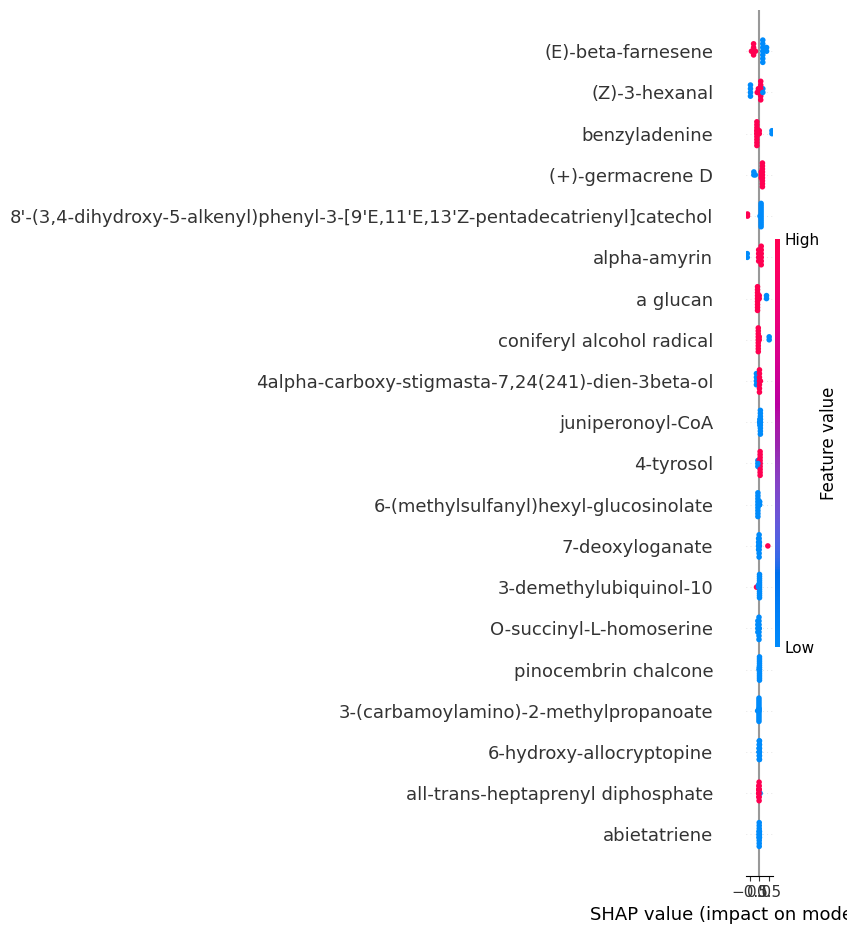

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, shuffle=True, stratify=y)


model = CatBoostClassifier(
    verbose=True,
    # task_type='GPU',
    # devices='0:1',
    # cat_features=cats,
    # learning_rate=0.3,
        iterations=5,
   depth=4
)

model.fit(X_train, y_train)

print('\ntrain auc', roc_auc_score(y_train, model.predict_proba(X_train)[:, 1]))
print('test auc', roc_auc_score(y_test, model.predict_proba(X_test)[:, 1]))

print('train prauc', average_precision_score(y_train, model.predict_proba(X_train)[:, 1]))
print('test prauc', average_precision_score(y_test, model.predict_proba(X_test)[:, 1]))

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)


# Predicting plants genomic grouping

In [ ]:
df_final_combined = df_final_.merge(Database_names, how='left', left_on=['species'], right_on=['compound_name'])
df_final_combined

,species_x,(R)-mevalonate diphosphate,luteolinidin 5-O-beta-D-glucoside,N5-acetyl-L-ornithine,hygrine,solanid-3-one,(S)-N-methylcoclaurine,a methyl thioether,3-O-methylmyricetin,oxalosuccinate,...,suborder,tribe,subtribe,subgenus,species group,subspecies,forma,section,strain,varietas
0,acoeruleacyc,1,0,1,0,0,1,0,0,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ahallericyc,1,0,1,0,0,0,0,0,0,...,NaN,Camelineae,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ahypochondriacuscyc,1,0,1,0,0,0,0,0,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,alyratacyc,1,0,1,0,0,0,0,0,1,...,NaN,Camelineae,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,amborellacyc,1,0,1,0,0,0,0,0,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122,watermeloncyc,1,0,1,0,0,0,0,0,1,...,NaN,Benincaseae,NaN,NaN,NaN,Citrullus lanatus vulgaris,NaN,NaN,NaN,NaN
123,wheatacyc,1,1,1,0,0,0,0,0,0,...,NaN,Triticeae,Triticinae,NaN,NaN,NaN,NaN,NaN,NaN,NaN
124,wheatdcyc,1,0,1,0,0,0,0,0,1,...,NaN,Triticeae,Triticinae,NaN,NaN,NaN,NaN,NaN,NaN,NaN
125,wildsugarcanecyc,1,0,1,0,0,0,0,0,1,...,NaN,Andropogoneae,Saccharinae,NaN,NaN,NaN,NaN,NaN,NaN,NaN


To see if it is possible to classify plants by thier metabolites we tried to distiguish between two plant groups, Liliopsida and eudicotyledons which are both members of mesangiospermae. Our dataset contains 34 specimens of the Liliopsida group and 77 of the eudicotyledons group. if we train a classier to recognize that one group have metabolites that the other one doesn't and viseversa we should be able to build a classifier with very high accuracy.

In [ ]:
df_final_combined['is_mesangiosper'] = df_final_combined.lineage.apply(lambda x: 1 if type(x) is str and 'Mesangiosper' in x else 0)
df_mesang = df_final_combined[df_final_combined.is_mesangiosper == 1]
df_mesang['is_liliopsida'] = df_mesang.lineage.apply(lambda x: 1 if type(x) is str and 'Liliopsida' in x else 0)
df_mesang['is_eudicotyledons'] = df_mesang.lineage.apply(lambda x: 1 if type(x) is str and 'eudicotyledons' in x else 0)
df_mesang = df_mesang[(df_mesang.is_liliopsida == 1) | (df_mesang.is_eudicotyledons == 1)]
df_mesang['liliopsida_or_eudicotyledons'] = df_mesang['is_eudicotyledons']


In [ ]:
y = df_mesang['liliopsida_or_eudicotyledons']
X = df_mesang.drop(['Unnamed: 0.2', 'Unnamed: 0.1', 'Unnamed: 0', 'Database Name',
       'Link to Table', 'link_to_pgdb', 'official_name', 'compound_name',
       'label', 'comment', 'genus', 'wikiPageLength',
       'wiki_full_text', 'lineage', 'synonym', 'superkingdom', 'kingdom',
       'phylum', 'subphylum', 'order', 'family', 'subfamily', 'class',
       'subclass', 'clade', 'suborder', 'tribe', 'subtribe', 'subgenus',
       'species group', 'subspecies', 'forma', 'section', 'strain',
       'varietas', 'species_x', 'species_y', 'is_mesangiosper', 'is_liliopsida', 'is_eudicotyledons', 'liliopsida_or_eudicotyledons'], axis=1)
X

,(R)-mevalonate diphosphate,luteolinidin 5-O-beta-D-glucoside,N5-acetyl-L-ornithine,hygrine,solanid-3-one,(S)-N-methylcoclaurine,a methyl thioether,3-O-methylmyricetin,oxalosuccinate,a [glycerolipid]-alpha-linolenate,...,digitoxigenin,DIBOA,geraniol,1D-1-O-(indol-3-yl)acetyl-myo-inositol,an N-terminal-L-methionyl-L-leucyl-[protein],(indol-3-yl)acetyl-L-phenylalanine,(Z)-1-(glutathion-S-yl)-N-hydroxy-omega-(methylsulfanyl)pentan-1-imine,orientin,vellosimine,piperidine
1,1,0,1,0,0,0,0,0,0,1,...,0,1,1,0,0,1,1,0,0,0
2,1,0,1,0,0,0,0,0,1,1,...,0,0,1,0,0,1,0,0,0,0
3,1,0,1,0,0,0,0,0,1,1,...,0,0,1,0,0,1,0,0,0,0
5,1,0,1,0,0,0,1,0,1,1,...,0,0,0,1,0,1,0,0,0,0
6,1,0,0,0,0,0,0,0,1,0,...,0,1,1,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122,1,0,1,0,0,0,0,0,1,1,...,0,0,1,0,0,1,0,0,0,0
123,1,1,1,0,0,0,0,0,0,1,...,0,1,1,0,0,1,0,1,0,0
124,1,0,1,0,0,0,0,0,1,1,...,0,1,1,0,0,1,0,0,0,0
125,1,0,1,0,0,0,0,0,1,1,...,0,1,1,0,0,1,0,0,0,0


Learning rate set to 0.003447
0:	learn: 0.6884841	total: 241ms	remaining: 4m
1:	learn: 0.6848858	total: 482ms	remaining: 4m
2:	learn: 0.6809809	total: 733ms	remaining: 4m 3s
3:	learn: 0.6758524	total: 966ms	remaining: 4m
4:	learn: 0.6714350	total: 1.09s	remaining: 3m 36s
5:	learn: 0.6664170	total: 1.22s	remaining: 3m 21s
6:	learn: 0.6612048	total: 1.4s	remaining: 3m 18s
7:	learn: 0.6573009	total: 1.57s	remaining: 3m 15s
8:	learn: 0.6534335	total: 1.6s	remaining: 2m 56s
9:	learn: 0.6485185	total: 1.81s	remaining: 2m 59s
10:	learn: 0.6432535	total: 1.97s	remaining: 2m 57s
11:	learn: 0.6380731	total: 2.15s	remaining: 2m 56s
12:	learn: 0.6340704	total: 2.29s	remaining: 2m 54s
13:	learn: 0.6298112	total: 2.45s	remaining: 2m 52s
14:	learn: 0.6251646	total: 2.59s	remaining: 2m 49s
15:	learn: 0.6215155	total: 2.61s	remaining: 2m 40s
16:	learn: 0.6179092	total: 2.76s	remaining: 2m 39s
17:	learn: 0.6148281	total: 2.9s	remaining: 2m 38s
18:	learn: 0.6108521	total: 3.07s	remaining: 2m 38s
19:	lear

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


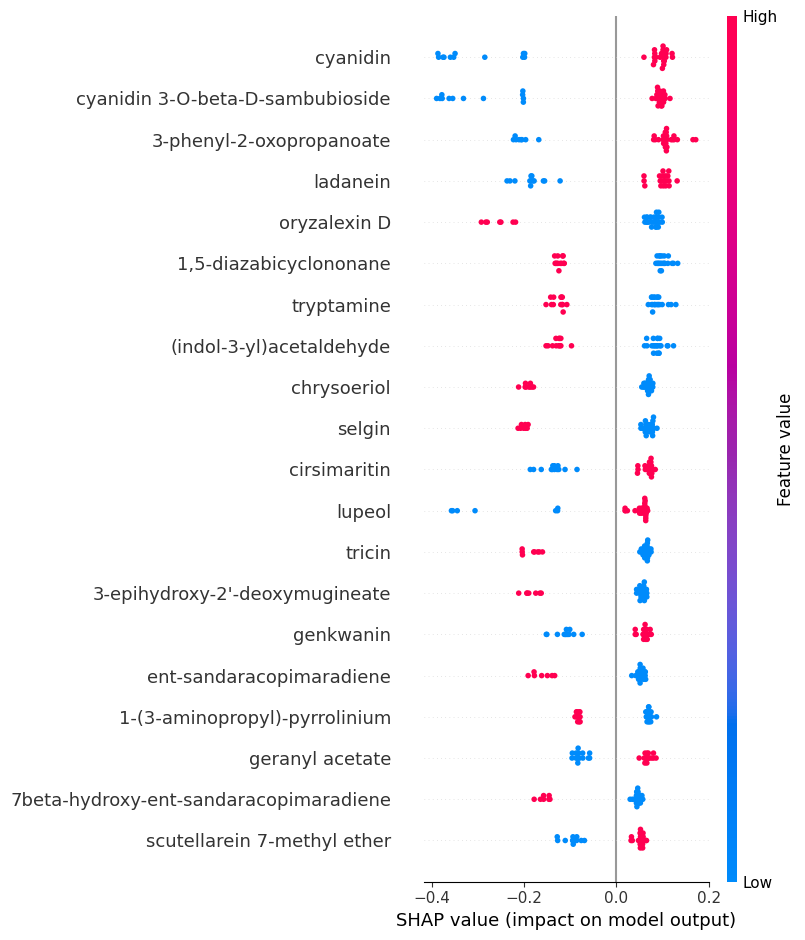

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, shuffle=True, stratify=y)


model = CatBoostClassifier(
    verbose=True,
    # task_type='GPU',
    # devices='0:1',
    # cat_features=cats,
    # learning_rate=0.3,
  #  depth=2
)

model.fit(X_train, y_train)

print('\ntrain auc', roc_auc_score(y_train, model.predict_proba(X_train)[:, 1]))
print('test auc', roc_auc_score(y_test, model.predict_proba(X_test)[:, 1]))

print('train prauc', average_precision_score(y_train, model.predict_proba(X_train)[:, 1]))
print('test prauc', average_precision_score(y_test, model.predict_proba(X_test)[:, 1]))

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)


Since gradient boosting trees work specifically well with tablular data we used CatBoostClassifier.
using catboost we reached perfect results. Using Shap feature importance we can see which metabolites presence or absence is predictive of being in which plants group.
for example 'cyanidin', 'cyanidin 3-O-beta-D-sambubioside', '3-phenyl-2-oxopropanoate' and 'ladanein'
are all metabolites which if present are predictive of being in the eudicotyledons group and if absent of being in the Liliopsida group.
On the other hand 'oryzalexing D', 'tryptamine', 'chrsoeriol' and 'selgin' are predictive of being in the Liliopsida group and if absent of being in the eudicotyledons group.

<ipython-input-211-4258d626f3e1>:21: DeprecationWarning:

nx.nx_pydot.graphviz_layout depends on the pydot package, which hasknown issues and is not actively maintained. Consider usingnx.nx_agraph.graphviz_layout instead.

See https://github.com/networkx/networkx/issues/5723



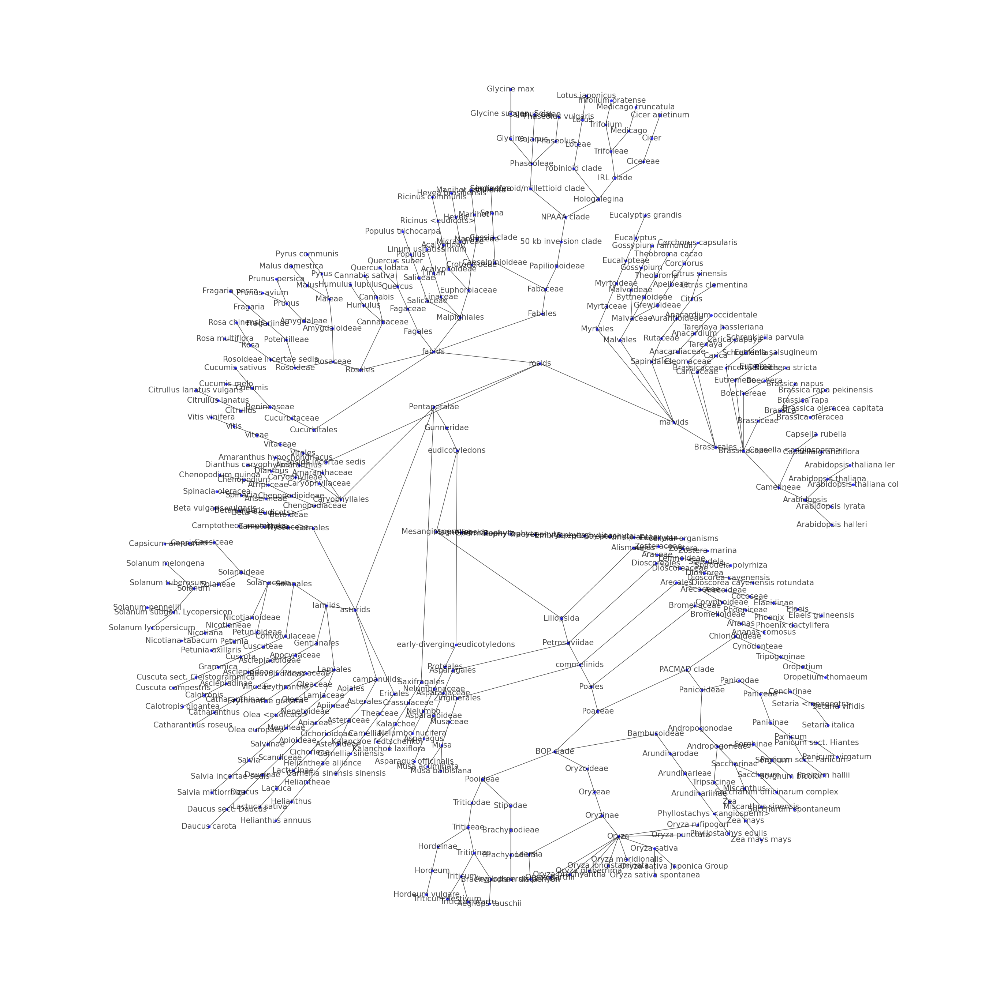

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
import pydot
from networkx.drawing.nx_pydot import graphviz_layout

g = nx.balanced_tree(4, 5)
e = list(g.nodes)
g.remove_nodes_from(e)
all_nodes = []
for index, row in df_mesang.iterrows():
  lin = eval(row.lineage)
  simple_lin = [node[1] for node in lin[:-1]]
  all_nodes += simple_lin
  for i in range(0, len(simple_lin) - 1):
    g.add_edge(simple_lin[i], simple_lin[i+1])

g.add_nodes_from(list(set(all_nodes)))



pos = graphviz_layout(g, prog="twopi")
plt.figure(figsize=(35, 35))
plt.axis('equal')

nx.draw(g, pos, node_size=20, alpha=0.7, node_color="blue", with_labels=True, font_size=15)
plt.show()



The polar dendrogram graph above which is used to plot hierarchies in a space efficient manner is a little crowded but it shows the lineage tree of the mesangiospermae group. we can see where Liliopsida and Eudicotyledons diverge. The right left section is the Liliopsida group and the Eudicotyledons is all that remains.

#Unsupervised Learning

In [ ]:
!pip install pandas scikit-learn matplotlib plotly

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import plotly.express as px
from sklearn.manifold import TSNE

In [ ]:
df_final_['species'] = df_final_.species.apply(lambda x: x.split('cyc')[0])

# Assuming df_final_ is your DataFrame
species_names = df_final_['species']
df_features = df_final_.drop(columns=['species'])

tsne_model = TSNE(n_components=2, random_state=42)
tsne_data = tsne_model.fit_transform(df_features)

tsne_df = pd.DataFrame(data=tsne_data, columns=['dim1', 'dim2'])
tsne_df['Species'] = species_names

# Create a scatter plot using Plotly Express
fig = px.scatter(
    tsne_df,
    x='dim1',
    y='dim2',
    color='Species',
    text='Species',  # Add species names as text labels
    title='t-SNE Visualization',
    labels={'dim1': 't-SNE Dimension 1', 'dim2': 't-SNE Dimension 2'},
)

# Customize the appearance of the plot
fig.update_traces(textposition='bottom center', textfont_size=8, opacity=0.7)
fig.update_layout(legend_title_text='Species',
    width=1000,  # Set the width of the plot
    height=1000,  # Set the height of the plot
)

fig.show()

#Combine data to one DF

In [ ]:
df_final_combined = df_final_.merge(Database_names, how='left', left_on=['species'], right_on=['compound_name'])
df_final_combined

,species_x,"(8Z,11Z,14Z,17Z)-3-oxoicosatetraenoyl-CoA",4-hydroxy-3-decaprenylbenzoate,tomatid-4-en-3-one,1-pyrroline,cathenamine,hydroxylamine,L-homomethionine,2-methylfumaryl-CoA,(-)-endo-alpha-bergamotene,...,suborder,tribe,subtribe,subgenus,species group,subspecies,forma,section,strain,varietas
0,acoeruleacyc,0,0,0,1,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ahallericyc,0,0,0,1,0,0,1,0,0,...,NaN,Camelineae,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ahypochondriacuscyc,0,0,0,1,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,alyratacyc,0,0,0,1,0,0,1,0,0,...,NaN,Camelineae,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,amborellacyc,0,0,0,1,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122,watermeloncyc,0,0,0,1,0,0,0,0,0,...,NaN,Benincaseae,NaN,NaN,NaN,Citrullus lanatus vulgaris,NaN,NaN,NaN,NaN
123,wheatacyc,0,0,0,1,0,0,0,0,0,...,NaN,Triticeae,Triticinae,NaN,NaN,NaN,NaN,NaN,NaN,NaN
124,wheatdcyc,0,0,0,1,0,0,0,0,0,...,NaN,Triticeae,Triticinae,NaN,NaN,NaN,NaN,NaN,NaN,NaN
125,wildsugarcanecyc,0,0,0,1,0,1,0,0,0,...,NaN,Andropogoneae,Saccharinae,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_final_combined.head()

,species_x,sinapyl alcohol,7-(methylsulfanyl)-2-oxoheptanoate,THF-L-glutamate,(2S)-pinocembrin,a [glycerolipid]-lesquerolate,glucoberteroin,oleanolic aldehyde,isobutanoate,8-C-glucosyl chrysin,...,suborder,tribe,subtribe,subgenus,species group,subspecies,forma,section,strain,varietas
0,acoeruleacyc,1,0,1,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ahallericyc,1,0,0,0,0,1,0,0,0,...,NaN,Camelineae,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ahypochondriacuscyc,1,0,1,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,alyratacyc,1,0,1,0,0,0,0,0,0,...,NaN,Camelineae,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,amborellacyc,1,0,1,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#Image classifier

Using CNN, we would like to classify the images based on the label which is a metabolic column. Based on the article that Rivki sent us, we selected metabolites that are known to play an important role in stress adaptation. we created a classifiers based on 3 different metabolites.

positive correlation column from "Predictive metabolomics of multiple Atacama plant species unveils a core set of generic metabolites for extreme
climate resilience"
positive correlation:

- raffinose
- leucodelphinidin

Negative correlation:
- alpha,alpha-trehalose

The main problem with the column is that there is a large class imbalance, one class is dominant and the other is not.

In [ ]:
!pip install fastai

In [ ]:
import numpy as np
import fastai
import os
from fastai import *
from fastai.vision import *
from fastai.vision.all import *
from glob import glob
from pathlib import Path

Create the dataset of the first label : raffinose

In [ ]:
df_final_combined[df_final_combined['official_name'] == 'Aegilops tauschii']['raffinose']

0      1
1      1
2      1
3      1
4      1
      ..
122    1
123    1
124    1
125    1
126    1
Name: raffinose, Length: 127, dtype: int64

In [ ]:
import os
import shutil
import pandas as pd

image_dir = "/content/drive/Shareddrives/big_data/plant_images"

label_0_raffinose = "/content/drive/Shareddrives/big_data/raffinose/label_0_images"
label_1_raffinose = "/content/drive/Shareddrives/big_data/raffinose/label_1_images"

os.makedirs(label_0_raffinose, exist_ok=True)
os.makedirs(label_1_raffinose, exist_ok=True)

for plant_name in os.listdir(image_dir):
   plant_path = os.path.join(image_dir, plant_name)
   if os.path.isdir(plant_path):
     label = df_final_combined[df_final_combined['official_name'] == plant_name]['raffinose'].values[0]
     dest_dir = label_1_raffinose if label == 1 else label_0_raffinose
     for img_name in os.listdir(plant_path):
            img_src_path = os.path.join(plant_path, img_name)
            img_dest_path = os.path.join(dest_dir, img_name)
            shutil.copy(img_src_path, img_dest_path)

All of the metablites from the article have high class balance, so we wanted to identify a column with a class balance in order to begin predicting it

In [ ]:
balance_threshold = 0.4
balanced_columns = []

for column in df_final_combined.columns:
    counts = df_final_combined[column].value_counts()
    proportion_0 = counts.get(0, 0) / len(df)
    proportion_1 = counts.get(1, 0) / len(df)
    if abs(proportion_0 - proportion_1) <= balance_threshold:
        balanced_columns.append(column)

print("Columns with balanced class distribution:", balanced_columns)

Columns with balanced class distribution: ['species_x', 'soyasaponin III', 'DIBOA', '(+)-costunolide (12,6alpha)', 'alpha-amyrin', '1-(4-hydroxyphenyl)-3-(2,4,6-trihydroxyphenyl)propane-1,3-dione', '2-oxoadipate', 'HBOA', '(R)-2-hydroxyglutarate', 'an all-trans-polyisoprenyl diphosphate', 'pelargonidin 3-O-sophoroside', '8-epi-inunolide', 'dioleoyl phosphatidate', '(-)-beta-caryophyllene', '(3R)-3-hydroxy-arachidoyl-CoA', 'phlorizin', '(3E,7E)-4,8,12-trimethyltrideca-1,3,7,11-tetraene', 'apiforol', '1-oleoyl-sn-glycerol 3-phosphate', 'sophoradiol', '4-maleyl-acetoacetate', 'ternatin C3', 'cinnamoyl-CoA', 'dihydroconiferyl alcohol', 'isopentenyladenine-7-N-glucoside', "3,5-di-C-glucosyl-2,4,4',6-tetrahydroxydibenzoylmethane", 'dopaquinone', 'germacra-1(10),4,11(13)-trien-12-ol', '6-amino-2-oxohexanoate', 'isopentenyladenine-9-N-glucoside', 'tryptamine', '(2R,3S,4S)-leucopelargonidin', '(3R)-3-hydroxycerotoyl-CoA', 'salvianin', 'genkwanin', '(indol-3-yl)acetaldehyde', 'cyanidin 3-O-beta-

In [ ]:
substring = 'ion'
matching_columns = [col for col in balanced_columns if substring in col]

print(matching_columns)

['1-(4-hydroxyphenyl)-3-(2,4,6-trihydroxyphenyl)propane-1,3-dione', 'section']


In [ ]:
balanced_columns

Creating the dataset for 'glutarate' metablite that haas balace class

In [ ]:
import os
import shutil
import pandas as pd
from sklearn.model_selection import train_test_split

image_dir = "/content/drive/Shareddrives/big_data/plant_images"

label_0_glutarate_train = "/content/drive/Shareddrives/big_data/glutarate/train/label_0_images"
label_1_glutarate_train = "/content/drive/Shareddrives/big_data/glutarate/train/label_1_images"
label_0_glutarate_test = "/content/drive/Shareddrives/big_data/glutarate/test/label_0_images"
label_1_glutarate_test = "/content/drive/Shareddrives/big_data/glutarate/test/label_1_images"


for directory in [label_0_glutarate_train, label_1_glutarate_train, label_0_glutarate_test, label_1_glutarate_test]:
    os.makedirs(directory, exist_ok=True)

train_df, test_df = train_test_split(df_final_combined, test_size=0.2, random_state=42)


for plant_name in train_df.official_name:
   plant_path = os.path.join(image_dir, plant_name)
   if os.path.isdir(plant_path):
     label = df_final_combined[df_final_combined['official_name'] == plant_name]['glutarate'].values[0]
     dest_dir = label_1_glutarate_train if label == 1 else label_0_glutarate_train
     for img_name in os.listdir(plant_path):
            img_src_path = os.path.join(plant_path, img_name)
            img_dest_path = os.path.join(dest_dir, img_name)
            shutil.copy(img_src_path, img_dest_path)

for plant_name in test_df.official_name:
   plant_path = os.path.join(image_dir, plant_name)
   if os.path.isdir(plant_path):
     label = df_final_combined[df_final_combined['official_name'] == plant_name]['glutarate'].values[0]
     dest_dir = label_1_glutarate_test if label == 1 else label_0_glutarate_test
     for img_name in os.listdir(plant_path):
            img_src_path = os.path.join(plant_path, img_name)
            img_dest_path = os.path.join(dest_dir, img_name)
            shutil.copy(img_src_path, img_dest_path)

There is a problem that parts of the images are invalid. so we had to remove them

In [ ]:
from PIL import Image, UnidentifiedImageError
import os
def remove_invalid_images(directory):
    removed_count = 0
    for img_name in os.listdir(directory):
        img_path = os.path.join(directory, img_name)
        print(img_path)
        try:
            img = Image.open(img_path)
        except (UnidentifiedImageError, IsADirectoryError, OSError):
            print("Removing invalid image:", img_path)
            os.remove(img_path)
            removed_count += 1
    return removed_count

root_directory = "/content/drive/Shareddrives/big_data/glutarate/test"

# Remove invalid images and get the count of removed images
total_removed_count = 0
for sub_directory in os.listdir(root_directory):
    sub_dir_path = os.path.join(root_directory, sub_directory)
    if os.path.isdir(sub_dir_path):
        removed_count = remove_invalid_images(sub_dir_path)
        total_removed_count += removed_count

print("Total invalid images removed:", total_removed_count)

In [ ]:
def count_files(directory):
    return len([file for file in os.listdir(directory) if os.path.isfile(os.path.join(directory, file))])

count_label_0_train = count_files(label_0_glutarate_train)
count_label_1_train = count_files(label_1_glutarate_train)
count_label_0_test = count_files(label_0_glutarate_test)
count_label_1_test = count_files(label_1_glutarate_test)

print("Label 0 train images:", count_label_0_train)
print("Label 1 train images:", count_label_1_train)
print("Label 0 test images:", count_label_0_test)
print("Label 1 test images:", count_label_1_test)

Label 0 train images: 185
Label 1 train images: 331
Label 0 test images: 28
Label 1 test images: 48


In [ ]:
np.random.seed(42)
path = Path('/content/drive/Shareddrives/big_data/glutarate')
tfms = aug_transforms(do_flip = True, flip_vert = False, mult=2.0)
data = ImageDataLoaders.from_folder(path, valid_pct=0.2, item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'), batch_tfms=tfms, bs = 30, num_workers = 4)

We used resnet as the model and fine tune with our images and labels

In [ ]:
learn = vision_learner(data, resnet34, metrics=accuracy)
learn.fine_tune(10)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


epoch,train_loss,valid_loss,accuracy,time
0,1.224089,1.203270,0.559322,02:34


epoch,train_loss,valid_loss,accuracy,time
0,1.105553,1.013269,0.466102,02:41
1,1.077093,0.918283,0.542373,02:57
2,1.026125,1.166347,0.542373,02:44
3,0.962203,1.069541,0.635593,02:39
4,0.881363,1.013701,0.694915,02:43
5,0.780115,1.169567,0.661017,02:45
6,0.702797,1.157857,0.652542,02:44
7,0.638072,1.142790,0.644068,02:37
8,0.600763,1.138984,0.652542,02:45
9,0.551091,1.135125,0.661017,02:39


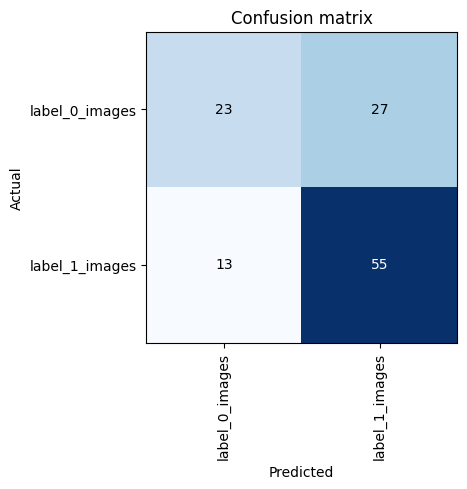

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

In [ ]:
interp.print_classification_report()

                precision    recall  f1-score   support

label_0_images       0.64      0.46      0.53        50
label_1_images       0.67      0.81      0.73        68

      accuracy                           0.66       118
     macro avg       0.65      0.63      0.63       118
  weighted avg       0.66      0.66      0.65       118



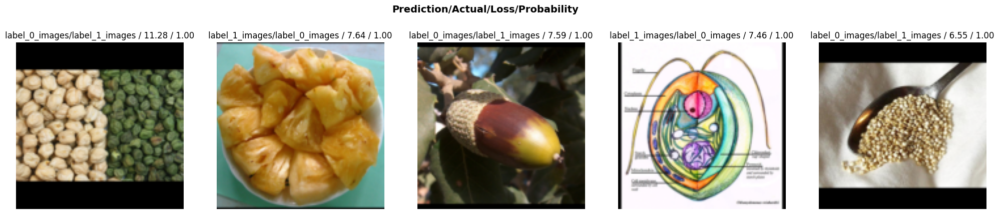

In [ ]:
interp.plot_top_losses(5, nrows=1, figsize = (25,5))

Lets try another metablite - cyanidin

In [ ]:
# shutil.rmtree('/content/drive/Shareddrives/big_data/cyanidin')

In [ ]:
import os
import shutil
import pandas as pd
from sklearn.model_selection import train_test_split

image_dir = "/content/drive/Shareddrives/big_data/plant_images"

label_0_cyanidin_train = "/content/drive/Shareddrives/big_data/cyanidin/train/label_0_images"
label_1_cyanidin_train = "/content/drive/Shareddrives/big_data/cyanidin/train/label_1_images"
label_0_cyanidin_test = "/content/drive/Shareddrives/big_data/cyanidin/test/label_0_images"
label_1_cyanidin_test = "/content/drive/Shareddrives/big_data/cyanidin/test/label_1_images"


for directory in [label_0_cyanidin_train, label_1_cyanidin_train, label_0_cyanidin_test, label_1_cyanidin_test]:
    os.makedirs(directory, exist_ok=True)

train_df, test_df = train_test_split(df_final_combined, test_size=0.2, random_state=42)


for plant_name in train_df.official_name:
   plant_path = os.path.join(image_dir, plant_name)
   if os.path.isdir(plant_path):
     label = df_final_combined[df_final_combined['official_name'] == plant_name]['cyanidin'].values[0]
     dest_dir = label_1_cyanidin_train if label == 1 else label_0_cyanidin_train
     for img_name in os.listdir(plant_path):
            img_src_path = os.path.join(plant_path, img_name)
            img_dest_path = os.path.join(dest_dir, img_name)
            shutil.copy(img_src_path, img_dest_path)

for plant_name in test_df.official_name:
   plant_path = os.path.join(image_dir, plant_name)
   if os.path.isdir(plant_path):
     label = df_final_combined[df_final_combined['official_name'] == plant_name]['cyanidin'].values[0]
     dest_dir = label_1_cyanidin_test if label == 1 else label_0_cyanidin_test
     for img_name in os.listdir(plant_path):
            img_src_path = os.path.join(plant_path, img_name)
            img_dest_path = os.path.join(dest_dir, img_name)
            shutil.copy(img_src_path, img_dest_path)

In [ ]:
def count_files(directory):
    return len([file for file in os.listdir(directory) if os.path.isfile(os.path.join(directory, file))])

count_label_0_train = count_files(label_0_cyanidin_train)
count_label_1_train = count_files(label_1_cyanidin_train)
count_label_0_test = count_files(label_0_cyanidin_test)
count_label_1_test = count_files(label_1_cyanidin_test)

print("Label 0 train images:", count_label_0_train)
print("Label 1 train images:", count_label_1_train)
print("Label 0 test images:", count_label_0_test)
print("Label 1 test images:", count_label_1_test)

Label 0 train images: 165
Label 1 train images: 350
Label 0 test images: 22
Label 1 test images: 54


In [ ]:
np.random.seed(42)
path = Path('/content/drive/Shareddrives/big_data/cyanidin')
tfms = aug_transforms(do_flip = True, flip_vert = False, mult=2.0)
data = ImageDataLoaders.from_folder(path, valid_pct=0.2, item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'), batch_tfms=tfms, bs = 30, num_workers = 4)


We found that the best result was obtained after 5 iterations in the last learner, so we changed the number of epochs to 5 and used Densenet as the model

In [ ]:
learn = vision_learner(data, densenet161, metrics=accuracy)
learn.fine_tune(7)

epoch,train_loss,valid_loss,accuracy,time
0,1.521362,1.449322,0.542373,02:28


epoch,train_loss,valid_loss,accuracy,time
0,1.146172,1.470139,0.542373,02:57
1,0.975860,1.424618,0.567797,02:57
2,0.874691,1.106851,0.652542,02:56
3,0.764868,1.246101,0.618644,02:55
4,0.669946,1.059600,0.677966,02:53
5,0.574743,0.987607,0.711864,02:55


epoch,train_loss,valid_loss,accuracy,time
0,1.146172,1.470139,0.542373,02:57
1,0.975860,1.424618,0.567797,02:57
2,0.874691,1.106851,0.652542,02:56
3,0.764868,1.246101,0.618644,02:55
4,0.669946,1.059600,0.677966,02:53
5,0.574743,0.987607,0.711864,02:55
6,0.490734,0.992276,0.711864,02:56


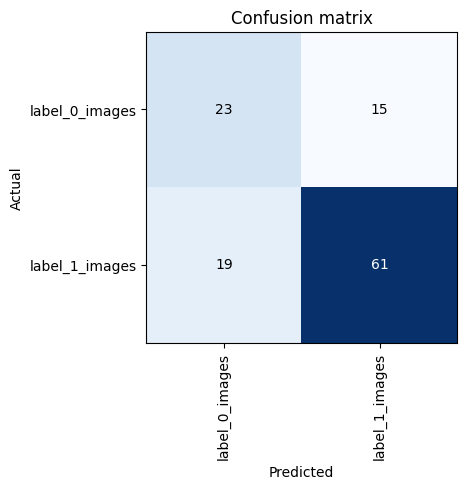

In [ ]:
interp_densenet = ClassificationInterpretation.from_learner(learn)
interp_densenet.plot_confusion_matrix()

In [ ]:
interp_densenet.print_classification_report()

                precision    recall  f1-score   support

label_0_images       0.55      0.61      0.57        38
label_1_images       0.80      0.76      0.78        80

      accuracy                           0.71       118
     macro avg       0.68      0.68      0.68       118
  weighted avg       0.72      0.71      0.72       118



In [ ]:
interp_densenet.plot_top_losses(5, nrows=1, figsize = (25,5))

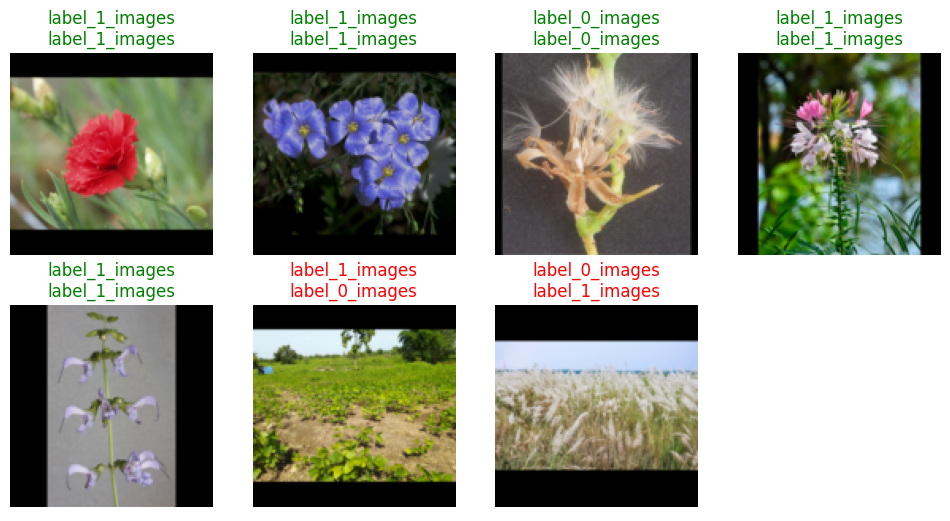

In [ ]:
interp_densenet.show_results([10,13,27,18,33,42,41])